In [1]:
import os
os.chdir("../..")

In [2]:
from commons.api.utils import set_to_our_gpus, enable_web_access
set_to_our_gpus()
enable_web_access()

In [2]:
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import torch
from torchvision import transforms, models
from torchvision.models import ResNet18_Weights, ResNet50_Weights, RegNet_Y_16GF_Weights

from ultralytics import YOLO

from commons.api.segment_saliency import generate_segmentation_mask, pixels_to_polygon, polygon_to_pixels, generate_saliency_from_polygon, plot_polygon
from commons.api.imagenet_tiny import get_imagenet_classes, get_random_images
from commons.api.vit import load_vit
from commons.api.viz import visualize_saliency_overlay
from commons.api.method.attention_rollout import rollout, grad_rollout, vit_saliency_map
from commons.api.metric.ior import insalient_outsalient_ratio

from cam import CAM, ScoreCAM, GradCAM, GradCAMpp, SmoothGradCAMpp

In [3]:
os.chdir("abid/ior_analysis")

In [4]:
vit_model = load_vit()

Using cache found in C:\Users\Khisrow/.cache\torch\hub\facebookresearch_deit_main


In [5]:
yolo_model = YOLO('yolov8m-seg.pt')

def generate_yolo_segmentation_mask(model, img_input):
    results = model(img_input)
    if results[0].masks != None:
        return np.array(Image.fromarray(results[0].masks.cpu().data[0].numpy()).resize((224, 224)))
    else:
        return results[0].masks

In [6]:
use_cuda = True
device = torch.device("cuda" if use_cuda else "cpu")

resnet_model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1).to(device)
resnet_model.eval();
target_layer = resnet_model.layer4[1].conv2

resnet_transform = transforms.Compose([transforms.Resize((256, 256)),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])])

scorecam_wrapped_model = ScoreCAM(resnet_model, target_layer)

In [7]:
import json
def get_imagenet_classes(): 
    classes_json = "../../data/imagenet_class_index.json"
    classes = json.load(open(classes_json))
    classes = np.array(list(classes.values()))
    return classes[:, 1]

In [8]:
classes = get_imagenet_classes()

In [9]:
ground_saliencies = np.load('../data/ground_saliency_images/ground_saliencies_2_fixed.npy')
images = np.load('../data/ground_saliency_images/images_2_fixed.npy')
obj_masks = np.load('../data/ground_saliency_images/obj_masks_2_fixed.npy')

In [10]:
def insalient_outsalient_ratio_new(reference, comparative, object_mask):
    assert(reference.shape == comparative.shape)
    agreement = reference * comparative

    epsilon = 1e-8
    insalient_agreement = (agreement * object_mask) + epsilon
    # insalient_agreement_norm = insalient_agreement / insalient_agreement.max()
    # insalient_agreement_norm = np.where(insalient_agreement_norm >= 0.9, 1, insalient_agreement_norm)

    reference_distribution = reference + epsilon
    reference_distribution = reference_distribution / reference_distribution.sum()
    
    reference_in_distribution = (reference_distribution * object_mask)

    # Expect in-saliency agreement to be in the same place. Also the value that is concentrated in the reference must be the one with greatest agreement as well.
    insalient = np.sum(insalient_agreement * reference_in_distribution)

    # expect the saliency outside mask to be spurious and spread out and therefore, not coincide with each other in both saliencies
    outsalient_agreement = (reference * np.logical_not(object_mask).astype(float)) + epsilon
    # outsalient_agreement_norm = outsalient_agreement / outsalient_agreement.max()
    # outsalient_agreement_norm = np.where(outsalient_agreement_norm >= 0.9, 1, outsalient_agreement_norm)

    reference_out_distribution = reference_distribution * np.logical_not(object_mask).astype(float)

    # out-salient distribution must also not have large values
    outsalient = np.sum(outsalient_agreement * reference_out_distribution)

    return insalient/ (outsalient + insalient)


def ior_singluar(saliency, object_mask):
    epsilon = 1e-9
    inner_saliency = (saliency * object_mask) + epsilon
    outer_saliency = saliency * np.logical_not(object_mask).astype(float)
    
    return np.sum(inner_saliency) / (np.sum(inner_saliency) + np.sum(outer_saliency))

In [11]:
from io import BytesIO
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from matplotlib.transforms import IdentityTransform

def text_to_rgba(s, *, dpi, **kwargs):
    # To convert a text string to an image, we can:
    # - draw it on an empty and transparent figure;
    # - save the figure to a temporary buffer using ``bbox_inches="tight",
    #   pad_inches=0`` which will pick the correct area to save;
    # - load the buffer using ``plt.imread``.
    #
    # (If desired, one can also directly save the image to the filesystem.)
    fig = Figure(facecolor="none", figsize=(10, 10))
    fig.text(0, 0, s, **kwargs)
    with BytesIO() as buf:
        fig.savefig(buf, dpi=dpi, format="png", bbox_inches="tight",
                    pad_inches=0)
        buf.seek(0)
        rgba = plt.imread(buf)
    return rgba

### Visualization of how IOR works.
1. The punishes saliencies outside
How IOR changes when:
- The focus areas moves around (DONE)
- When the focus area gets spread out
- When there is less concentration of values, meaning more disjointed. 
- As saliency bleeds outside the object (DONE)
- As focus of the saliency changes to the outside (DONE)

### Do the same analysis for perturbations

### Change IOR so that its value is agnostic of the size of the object

<hr>

### 1. Preliminary IOR Examples using Synthetic data

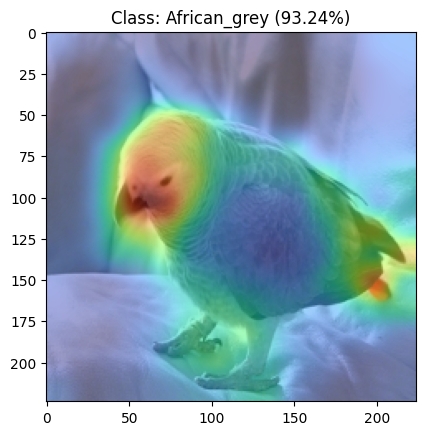

In [12]:
idx = 6

vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[idx]), vit_model)
visualize_saliency_overlay(plt.gca(), Image.fromarray(images[idx]), vit_cls_mask, vit_probs, vit_idx, classes);


0: 640x640 1 bird, 1 bed, 26.8ms
Speed: 3.5ms preprocess, 26.8ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


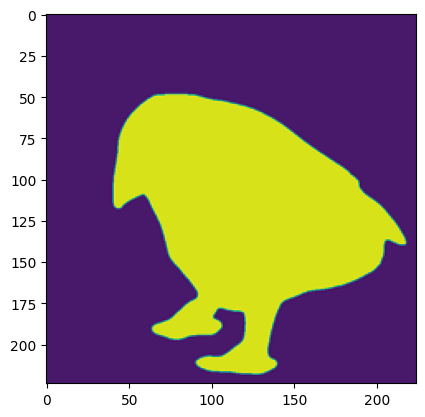

In [13]:
ref_mask = generate_yolo_segmentation_mask(yolo_model, images[idx])
plt.imshow(ref_mask)

In [14]:
def gkern(l=5, sig=1.):
    # side length `l`
    # sigma `sig`
    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sig))
    kernel = np.outer(gauss, gauss)
    return kernel / np.sum(kernel)

In [15]:
def generate_focus_point(img, focus_points):
    img = Image.fromarray(img)
    draw = ImageDraw.Draw(img)
    for idx, fp in enumerate(focus_points):
        p, r, fill_value = fp
        left_up_point = (p[0]-r, p[1]-r)
        right_down_point = (p[0]+r, p[1]+r)
        two_point_list = [left_up_point, right_down_point]
        draw.ellipse(two_point_list, fill=fill_value)
    img_np = np.array(img)
    kernel = gkern(30, 7)
    img_np = convolve2d(img_np, kernel, mode="same")
    return img_np

In [16]:
def plot_ior_comparison_focus_points(focus_points, changes):
    fig , axes = plt.subplots(ncols=2, nrows=1)
    fig.set_figheight(12)
    fig.set_figwidth(12)

    sal_1 = generate_focus_point(blank_img, focus_points)
    axes[0].imshow(sal_1)
    axes[0].set_title("Comparative")
    for idx, fp in enumerate(focus_points):
        xy, r, fill_value = fp
        x, y = xy
        axes[0].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
        

    changed_focus_ps = []
    for idx, change in enumerate(changes):
        translate, scale, value = change
        fp = []
        pos = [focus_points[idx][0][0] + translate[0],  focus_points[idx][0][1] + translate[1]]
        fp.append(pos)
        fp.append(focus_points[idx][1] * scale)
        fp.append(focus_points[idx][2] * value)
        changed_focus_ps.append(fp)

    sal_2 = generate_focus_point(blank_img, changed_focus_ps)
    axes[1].imshow(sal_2 * ref_mask)
    for idx, fp in enumerate(changed_focus_ps):
        xy, r, fill_value = fp
        x, y = xy
        axes[1].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
    axes[1].set_title(f"Reference. IOR = {insalient_outsalient_ratio_new(sal_2, sal_1, ref_mask):.4f}");

In [17]:
blank_img = np.zeros((224, 224))
focus_points = [[[140, 140], 20, 1.0], # 0
                [[130, 80], 15, 0.4], # 1
                [[100, 160], 10, 0.8], # 2
                [[160, 100], 16, 0.4], # 3
                [[75, 90], 15, 0.7]]  # 4

#### When there are no saliency outside the object

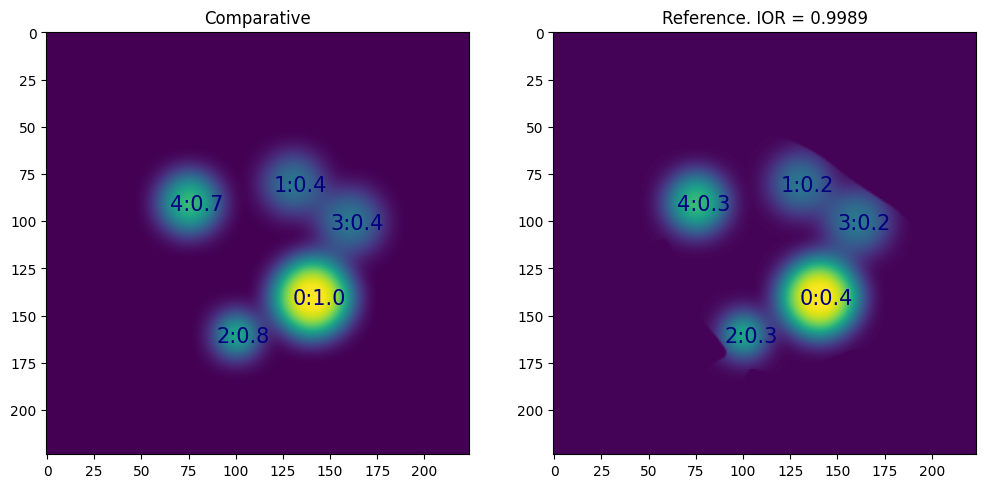

In [211]:
# The relative values within the objects does not change the metric all that much
# In here the values have been lessened yet the value barely changes
plot_ior_comparison_focus_points(focus_points, [[(0, 0), 1, 0.4], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(0, 0), 1, 0.4], # 2
                                                [(0, 0), 1, 0.4], # 3
                                                [(0, 0), 1, 0.4]]) # 4

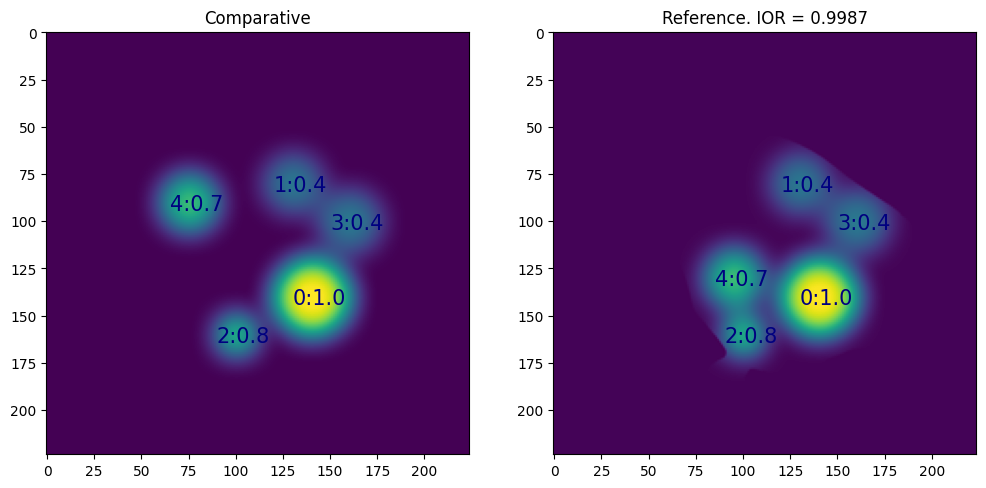

In [212]:
plot_ior_comparison_focus_points(focus_points, [[(0, 0), 1, 1], # 0
                                                [(0, 0), 1, 1], # 1
                                                [(0, 0), 1, 1], # 2
                                                [(0, 0), 1, 1], # 3
                                                [(20, 40), 1, 1]]) # 4

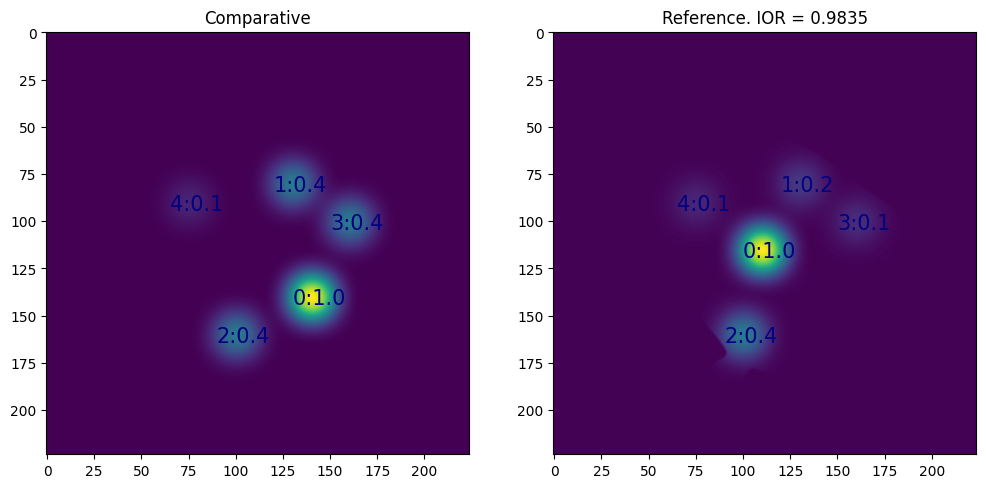

In [290]:
# However, the values that does not match the same position in both of the saliency maps (agreement) lowers the final metric value.
# Yet, since the saliency values do not bleed into outside the object, the discrepancies is not as prevalent as when we have saliency outside
# the object. Therefore, when all are inside object, the value is still high as it shows that the model did focus on the object itself.
# So, to clarify, the position of insalient values only matter when we have values outside the object.
focus_points = [[[140, 140], 10, 1.0], # 0
                [[130, 80], 10, 0.4], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.4], # 3
                [[75, 90], 10, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(-30, -25), 1, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(0, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

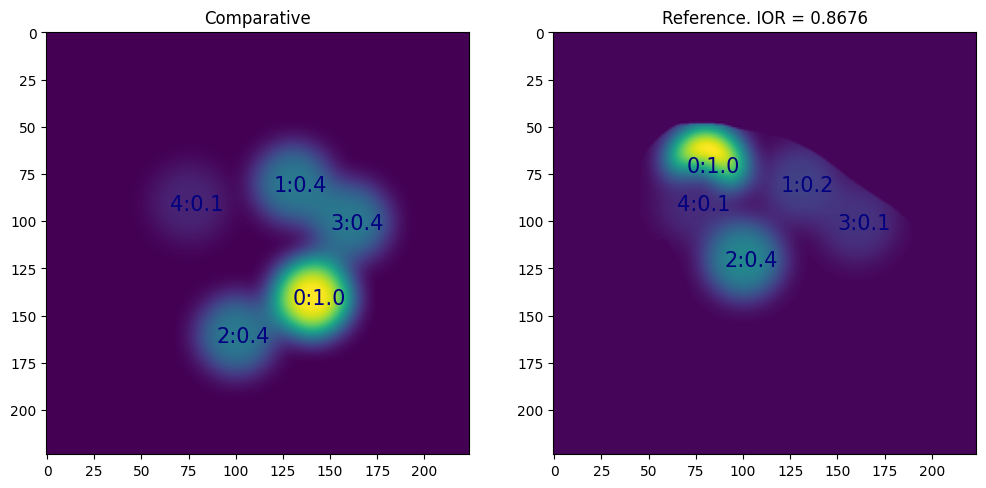

In [294]:
# Another example for the case above
focus_points = [[[140, 140], 20, 1.0], # 0
                [[130, 80], 20, 0.4], # 1
                [[100, 160], 20, 0.4], # 2
                [[160, 100], 20, 0.4], # 3
                [[75, 90], 20, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(-60, -70), 1, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(0, -40), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

#### When we have outsalient values (saliency values outside the object)

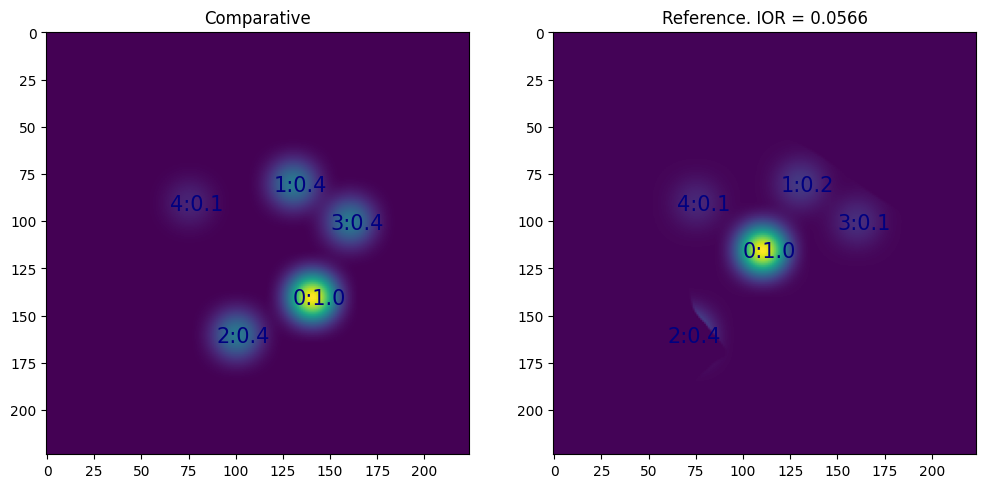

In [285]:
# To prove that the value starts decreasing the moment we go out of the object, look below (the same as above except for a saliency being
# outside the object
# As can been seen here the position of the values becomes more sensitive as we have more saliencies outside of our object

# Print a failure case here, in which if the radius is large then the value would not decrease all that much
focus_points = [[[140, 140], 10, 1.0], # 0
                [[130, 80], 10, 0.4], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.4], # 3
                [[75, 90], 10, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(-30, -25), 1, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(-30, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

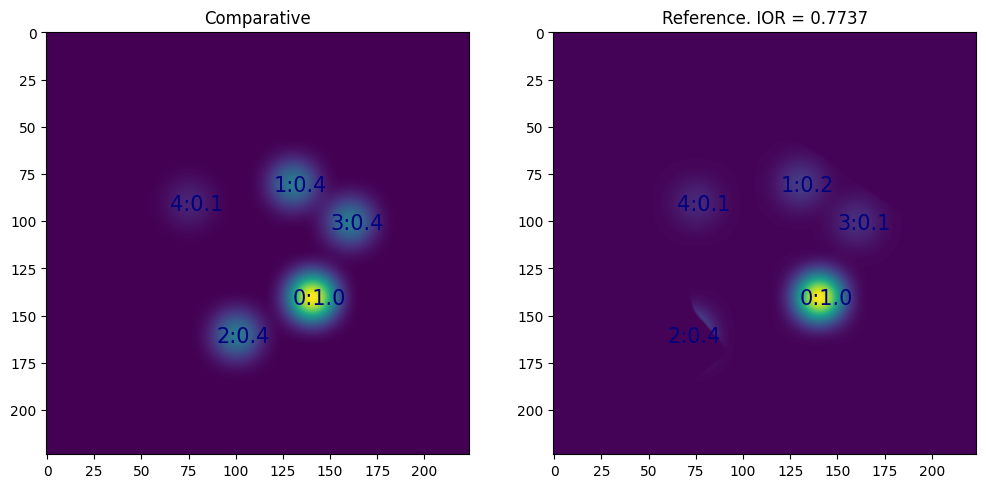

In [286]:
# In here, we have the same as above but now we have the highest saliency (idx : 0) back to its original position, which increases the value
# again, showing how sensitive the metric gets if we have saliency outside of the object

focus_points = [[[140, 140], 10, 1.0], # 0
                [[130, 80], 10, 0.4], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.4], # 3
                [[75, 90], 10, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(0, 0), 1, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(-30, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

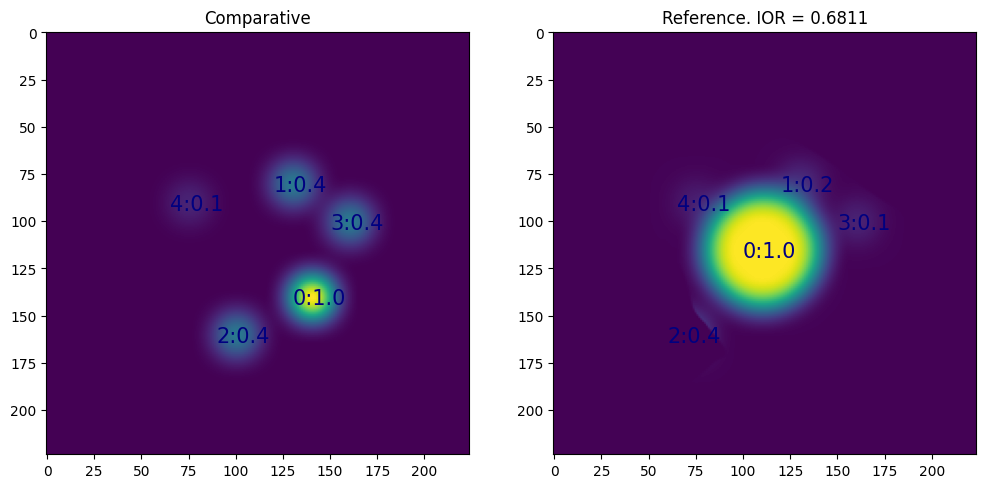

In [295]:
# Print a failure case here, in which if the radius is large then the value would not decrease all that much
# I don't know if this is a failure case, because if the model is focusing on a particular thing (small raidus) then small changes would
# mean that its focusing on a wrong thing (even if its narrow radius), however, if it is large portion, then it could be focusing on a more
# general part and so the little deviation in position there should penalize the value as much
focus_points = [[[140, 140], 10, 1.0], # 0
                [[130, 80], 10, 0.4], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.4], # 3
                [[75, 90], 10, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(-30, -25), 3, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(-30, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

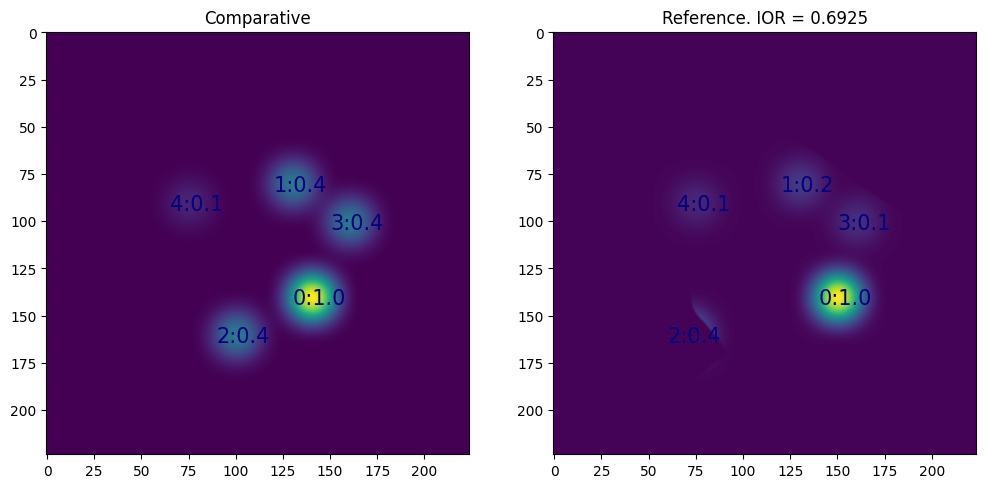

In [292]:
# As can be seen here, a slight change of the idx : 0 point (by 10 pixels) decreases our value by ~9-11 points
focus_points = [[[140, 140], 10, 1.0], # 0
                [[130, 80], 10, 0.4], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.4], # 3
                [[75, 90], 10, 0.1]]  # 4
plot_ior_comparison_focus_points(focus_points, [[(10, 0), 1, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(-30, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

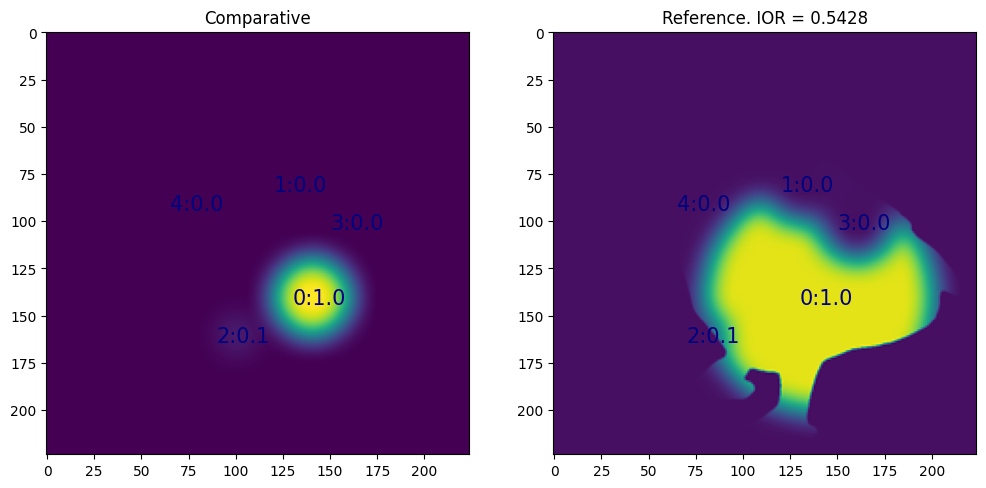

In [301]:
# When the radius of the reference increases and bleeds outside of what the saliency values allocates in the comparative saliency map,
# then the values also decreases (even though the positions might be the same here)
# This effect happens due two factors:
# 1. The values for the reference is more spread out, therefore, decrease the overall value.
# 2. Since the radius increases, the chances of going outside the object also increases which lowers the value.
focus_points = [[[140, 140], 20, 1.0], # 0
                [[130, 80], 20, 0.], # 1
                [[100, 160], 10, 0.1], # 2
                [[160, 100], 20, 0.0], # 3
                [[75, 90], 20, 0.0]]  # 4

plot_ior_comparison_focus_points(focus_points, [[(0, 0), 3, 1], # 0
                                                [(0, 0), 1, 0.4], # 1
                                                [(-20, 0), 1, 1], # 2
                                                [(0, 0), 1, 0.3], # 3
                                                [(0, 0), 1, 1]]) # 4

#### When there is less concentration of values, meaning more disjointed saliencies within the object.

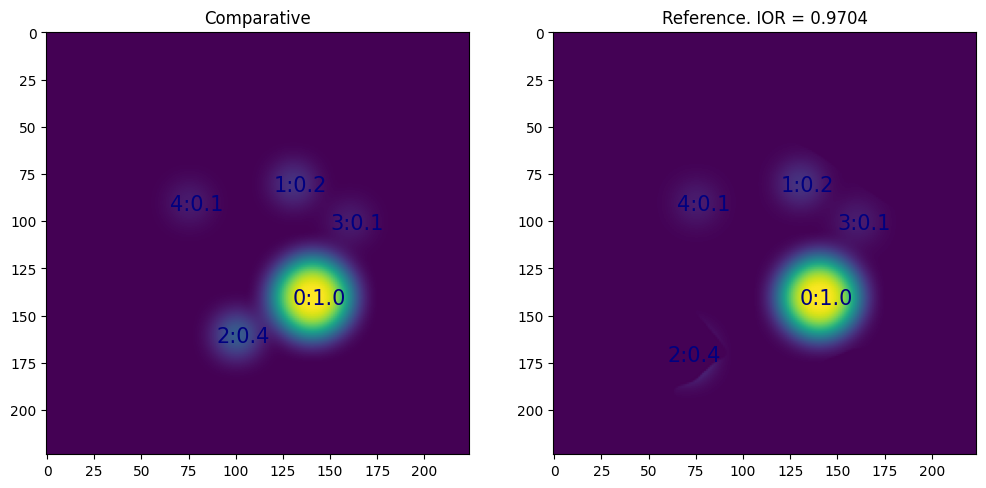

In [370]:
focus_points = [[[140, 140], 20, 1.0], # 0
                [[130, 80], 10, 0.2], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.1], # 3
                [[75, 90], 10, 0.1]]  # 4

fig , axes = plt.subplots(ncols=2, nrows=1)
fig.set_figheight(12)
fig.set_figwidth(12)
sal_1 = generate_focus_point(blank_img, focus_points)
axes[0].imshow(sal_1)
axes[0].set_title("Comparative")
for idx, fp in enumerate(focus_points):
    xy, r, fill_value = fp
    x, y = xy
    axes[0].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
    
changes = [[(0, 0), 1, 1], # 0
           [(0, 0), 1, 1], # 1
           [(-30, 10), 1, 1], # 2
           [(0, 0), 1, 1], # 3
           [(0, 0), 1, 1]] # 4
    
changed_focus_ps = []
for idx, change in enumerate(changes):
    translate, scale, value = change
    fp = []
    pos = [focus_points[idx][0][0] + translate[0],  focus_points[idx][0][1] + translate[1]]
    fp.append(pos)
    fp.append(focus_points[idx][1] * scale)
    fp.append(focus_points[idx][2] * value)
    changed_focus_ps.append(fp)
    
# generate_focus_point
img = Image.fromarray(blank_img)
draw = ImageDraw.Draw(img)
for idx, fp in enumerate(changed_focus_ps):
    p, r, fill_value = fp
    left_up_point = (p[0]-r, p[1]-r)
    right_down_point = (p[0]+r, p[1]+r)
    two_point_list = [left_up_point, right_down_point]
    draw.ellipse(two_point_list, fill=fill_value)
sal_2 = np.array(img)

kernel = gkern(30, 7)
sal_2 = convolve2d(sal_2, kernel, mode="same")

# randomly zero out areas inside the saliency
# pos = focus_points[0][0]
# start_pos = pos[0]-focus_points[0][1]
# end_pos = pos[0]+focus_points[0][1]
# sample_size = 10
# zero_area_size = 10
# pos_x_to_zero = random.sample(range(start_pos, end_pos+1), sample_size)
# pos_y_to_zero = random.sample(range(start_pos, end_pos+1), sample_size)
# for pos_idx in range(len(pos_x_to_zero)):
#     sal_2[pos_x_to_zero[pos_idx]:pos_x_to_zero[pos_idx]+zero_area_size, pos_y_to_zero[pos_idx]:pos_y_to_zero[pos_idx]+zero_area_size] = 0
# kernel = gkern(40, 2)
# sal_2 = convolve2d(sal_2, kernel, mode="same")

axes[1].imshow(sal_2 * ref_mask)
for idx, fp in enumerate(changed_focus_ps):
    xy, r, fill_value = fp
    x, y = xy
    axes[1].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
axes[1].set_title(f"Reference. IOR = {insalient_outsalient_ratio_new(sal_2, sal_1, ref_mask):.4f}");

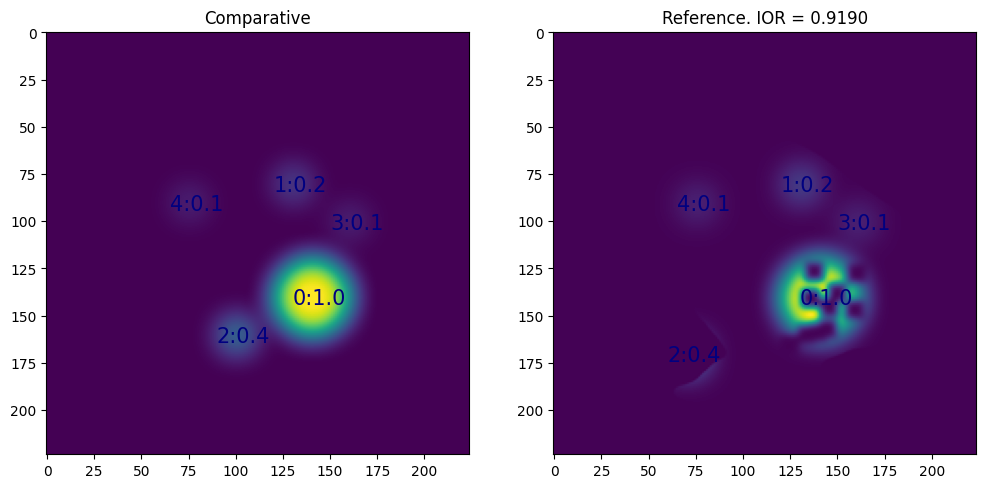

In [369]:
import random
focus_points = [[[140, 140], 20, 1.0], # 0
                [[130, 80], 10, 0.2], # 1
                [[100, 160], 10, 0.4], # 2
                [[160, 100], 10, 0.1], # 3
                [[75, 90], 10, 0.1]]  # 4

fig , axes = plt.subplots(ncols=2, nrows=1)
fig.set_figheight(12)
fig.set_figwidth(12)
sal_1 = generate_focus_point(blank_img, focus_points)
axes[0].imshow(sal_1)
axes[0].set_title("Comparative")
for idx, fp in enumerate(focus_points):
    xy, r, fill_value = fp
    x, y = xy
    axes[0].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
    
changes = [[(0, 0), 1, 1], # 0
           [(0, 0), 1, 1], # 1
           [(-30, 10), 1, 1], # 2
           [(0, 0), 1, 1], # 3
           [(0, 0), 1, 1]] # 4
    
changed_focus_ps = []
for idx, change in enumerate(changes):
    translate, scale, value = change
    fp = []
    pos = [focus_points[idx][0][0] + translate[0],  focus_points[idx][0][1] + translate[1]]
    fp.append(pos)
    fp.append(focus_points[idx][1] * scale)
    fp.append(focus_points[idx][2] * value)
    changed_focus_ps.append(fp)
    
# generate_focus_point
img = Image.fromarray(blank_img)
draw = ImageDraw.Draw(img)
for idx, fp in enumerate(changed_focus_ps):
    p, r, fill_value = fp
    left_up_point = (p[0]-r, p[1]-r)
    right_down_point = (p[0]+r, p[1]+r)
    two_point_list = [left_up_point, right_down_point]
    draw.ellipse(two_point_list, fill=fill_value)
sal_2 = np.array(img)

kernel = gkern(30, 7)
sal_2 = convolve2d(sal_2, kernel, mode="same")

# randomly zero out areas inside the saliency
pos = focus_points[0][0]
start_pos = pos[0]-focus_points[0][1]
end_pos = pos[0]+focus_points[0][1]
sample_size = 10
zero_area_size = 10
pos_x_to_zero = random.sample(range(start_pos, end_pos+1), sample_size)
pos_y_to_zero = random.sample(range(start_pos, end_pos+1), sample_size)
for pos_idx in range(len(pos_x_to_zero)):
    sal_2[pos_x_to_zero[pos_idx]:pos_x_to_zero[pos_idx]+zero_area_size, pos_y_to_zero[pos_idx]:pos_y_to_zero[pos_idx]+zero_area_size] = 0
kernel = gkern(40, 2)
sal_2 = convolve2d(sal_2, kernel, mode="same")

axes[1].imshow(sal_2 * ref_mask)
for idx, fp in enumerate(changed_focus_ps):
    xy, r, fill_value = fp
    x, y = xy
    axes[1].text(x-10, y+4, f'{idx}:{fill_value:.1f}', color="navy", fontsize=15)
axes[1].set_title(f"Reference. IOR = {insalient_outsalient_ratio_new(sal_2, sal_1, ref_mask):.4f}");

<hr>

### 2. Analyzing IOR with Occlusion

In [18]:
def apply_patch(image, top_left_x, top_left_y, patch_size):
    patched_image = np.copy(image)
    patched_image[top_left_y : top_left_y+patch_size,
                  top_left_x : top_left_x+patch_size, :] = 0
    return patched_image

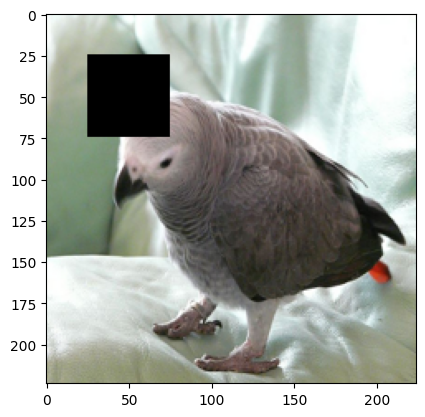

In [52]:
occ_img = apply_patch(images[6], 25, 25, 50).astype("float32") / 255.0
plt.imshow(occ_img)

In [19]:
def generate_img_occlusion_list(img, saliency, patch_size, saliency_reduce_func=np.mean):
    occlusion_img_list = []
    occlusion_saliency_statistic = []
    saliency = np.array(Image.fromarray(saliency).resize(img.shape[0], img.shape[1]))
    
    for top_left_y in range(0, img.shape[1], patch_size):
        for top_left_x in range(0, img.shape[0], patch_size):
            patched_image = apply_patch(img, top_left_x, top_left_y, patch_size).astype('float32') / 255.0
            occlusion_img_list.append(patched_image)
            occlusion_saliency_statistic.append(saliency_reduce_func(saliency[top_left_y : top_left_y+patch_size,
                                                                              top_left_x : top_left_x+patch_size]))
            
    return np.array(occlusion_img_list), np.array(occlusion_saliency_statistic)

def generate_img_occlusion_list_no_saliency(img, patch_size):
    occlusion_img_list = []
    occlusion_saliency_statistic = []
    
    for top_left_y in range(0, img.shape[1], patch_size):
        for top_left_x in range(0, img.shape[0], patch_size):
            patched_image = apply_patch(img, top_left_x, top_left_y, patch_size).astype('float32') / 255.0
            occlusion_img_list.append(patched_image)
            
    return np.array(occlusion_img_list)

In [20]:
img_idx = 6
patch_size = 40

In [26]:
gen_occlu_images = generate_img_occlusion_list(images[img_idx], patch_size)
np.save(f"occluded_image_list_patch_{patch_size}_idx_{img_idx}.npy", gen_occlu_images)

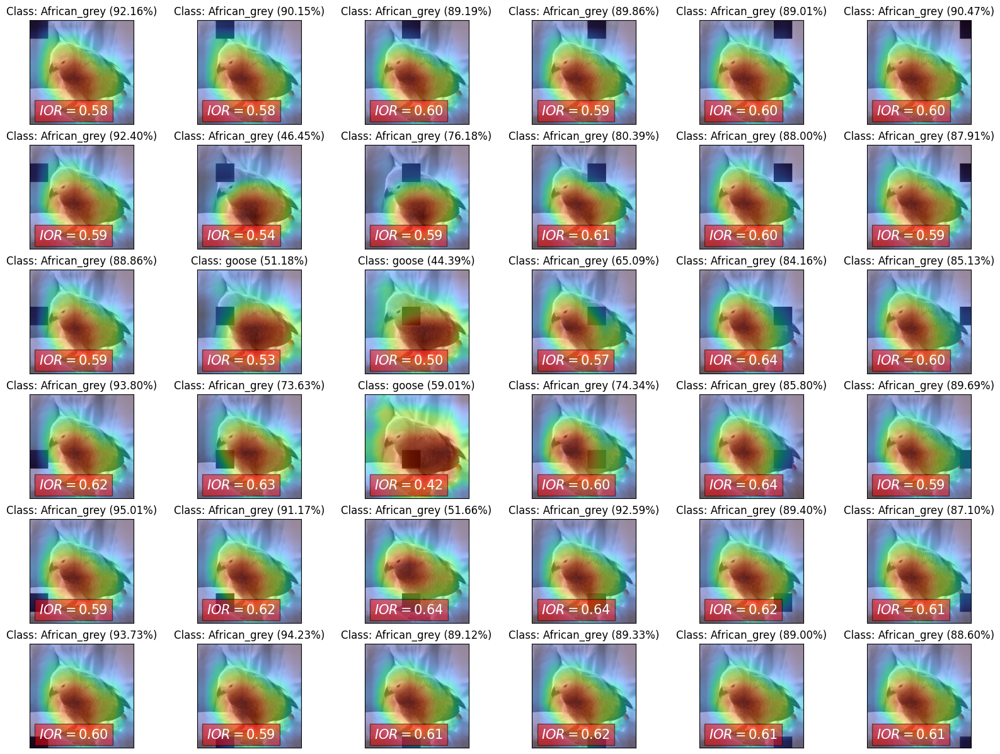

In [21]:
# Patch 40
img_idx = 6
patch_size = 40
ior_values = np.array([])
sample_occlu_imgs = np.load(f"occluded_image_list_patch_{patch_size}_idx_{img_idx}.npy")
fig, axes = plt.subplots(ncols=6, nrows=6)
fig.set_figheight(15)
fig.set_figwidth(20)

vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[img_idx]), vit_model)
for idx, axis in enumerate(axes.flat):
    img = Image.fromarray((sample_occlu_imgs[idx] * 255).astype(np.uint8))
    
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    visualize_saliency_overlay(axis, img, resnet_mask, resnet_probs, resnet_idx, classes);
    
    resized_vit_mask = np.array(Image.fromarray(vit_cls_mask).resize((256, 256)))
    resized_obj_mask = np.array(Image.fromarray(obj_masks[img_idx]).resize((256, 256)))
    
    ior = insalient_outsalient_ratio_new(resnet_mask, resized_vit_mask, resized_obj_mask)
    ior_values = np.append(ior_values, ior)
    axis.text(2*10, axis.get_ylim()[0]-2*10, f"$IOR={ior:.2f}$", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
    axis.get_xaxis().set_visible(False)
    axis.get_yaxis().set_visible(False)

Text(0.5, 1.0, 'IOR sensitivity to occlusion patch size of 40')

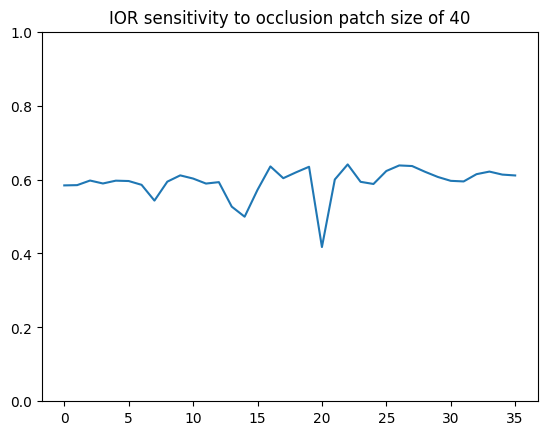

In [25]:
plt.plot(ior_values)
plt.ylim(0, 1)
plt.title(f"IOR sensitivity to occlusion patch size of {patch_size}")

[(0, 0.9215745329856873), (0, 0.9015317559242249), (0, 0.8919215798377991), (0, 0.8986459970474243), (0, 0.8900999426841736), (0, 0.9047468304634094), (0, 0.9240158796310425), (2, 0.4645161032676697), (3, 0.7617599964141846), (1, 0.8038809895515442), (0, 0.8799789547920227), (0, 0.8791068196296692), (1, 0.8885942697525024), (8, 0.18224602937698364), (11, 0.2474006861448288), (5, 0.6508561968803406), (2, 0.841618001461029), (0, 0.8512604236602783), (0, 0.9379748106002808), (8, 0.7362955808639526), (15, 0.134453684091568), (10, 0.7434290647506714), (4, 0.857981264591217), (0, 0.8968734741210938), (0, 0.9500989317893982), (2, 0.9116501212120056), (7, 0.5166095495223999), (6, 0.9259195327758789), (2, 0.894031286239624), (0, 0.8709732294082642), (0, 0.9373466968536377), (0, 0.9422860145568848), (0, 0.8911538124084473), (0, 0.8932942152023315), (0, 0.8900249600410461), (0, 0.886003851890564)]


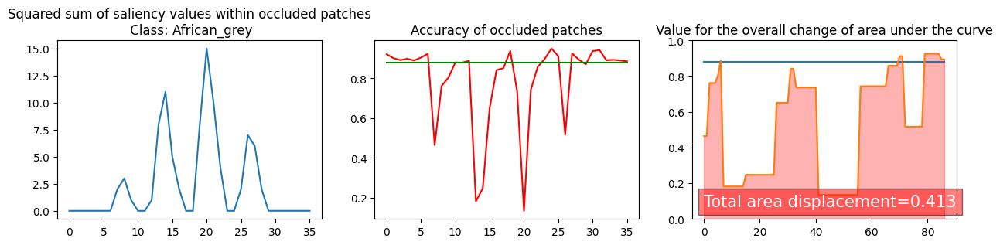

In [67]:
img_idx = 6
patch_size = 40
score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx = occlusion_run_accu_sensitivity(images[img_idx],
                                                                                                                                patch_size,
                                                                                                                                resnet_model_func,
                                                                                                                                np.sum)
print(list(zip(x_deltas, occluded_run_metric)))
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)

plot_occlusion_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx, classes)

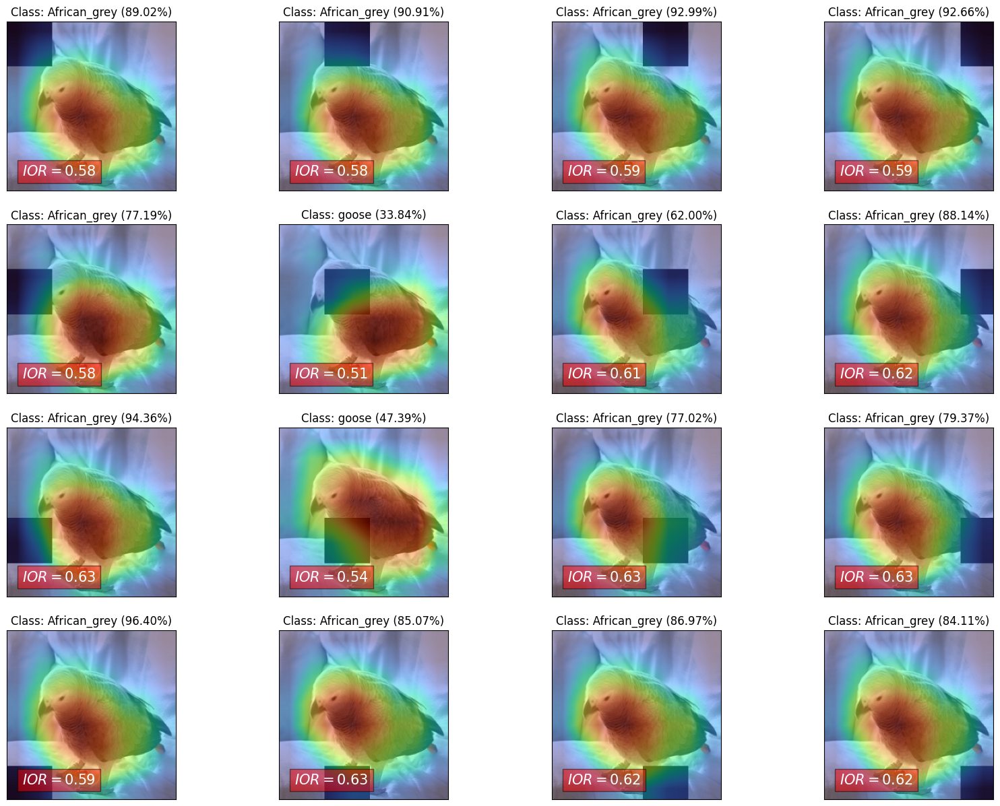

In [27]:
# Patch 60
img_idx = 6
patch_size = 60
sample_occlu_imgs = np.load(f"occluded_image_list_patch_{patch_size}_idx_{img_idx}.npy")
ior_values = np.array([])
fig, axes = plt.subplots(ncols=4, nrows=4)
fig.set_figheight(15)
fig.set_figwidth(20)

vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[img_idx]), vit_model)
for idx, axis in enumerate(axes.flat):
    img = Image.fromarray((sample_occlu_imgs[idx] * 255).astype(np.uint8))
    
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    visualize_saliency_overlay(axis, img, resnet_mask, resnet_probs, resnet_idx, classes);
    
    resized_vit_mask = np.array(Image.fromarray(vit_cls_mask).resize((256, 256)))
    resized_obj_mask = np.array(Image.fromarray(obj_masks[img_idx]).resize((256, 256)))
    
    ior = insalient_outsalient_ratio_new(resnet_mask, resized_vit_mask, resized_obj_mask)
    ior_values = np.append(ior_values, ior)
    axis.text(2*10, axis.get_ylim()[0]-2*10, f"$IOR={ior:.2f}$", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
    axis.get_xaxis().set_visible(False)
    axis.get_yaxis().set_visible(False)

Text(0.5, 1.0, 'IOR sensitivity to occlusion patch size of 60')

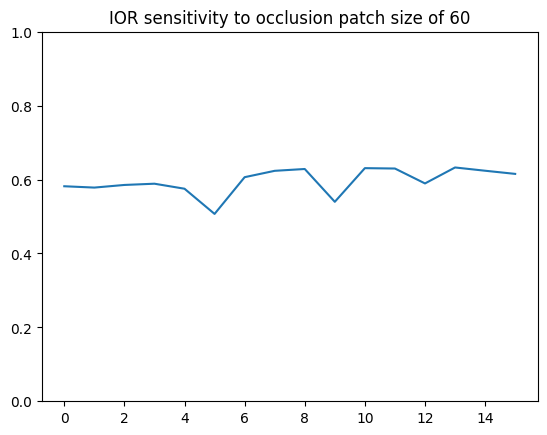

In [28]:
plt.plot(ior_values)
plt.ylim(0, 1)
plt.title(f"IOR sensitivity to occlusion patch size of {patch_size}")

[(0, 0.8902387022972107), (1, 0.9090813398361206), (0, 0.9298880100250244), (0, 0.9265623092651367), (4, 0.7719191908836365), (20, 0.1183152124285698), (8, 0.6199796795845032), (1, 0.881446361541748), (3, 0.9436215758323669), (29, 0.19932536780834198), (19, 0.7702270746231079), (2, 0.793690025806427), (0, 0.9639857411384583), (3, 0.8506860733032227), (3, 0.8697014451026917), (0, 0.8410627245903015)]


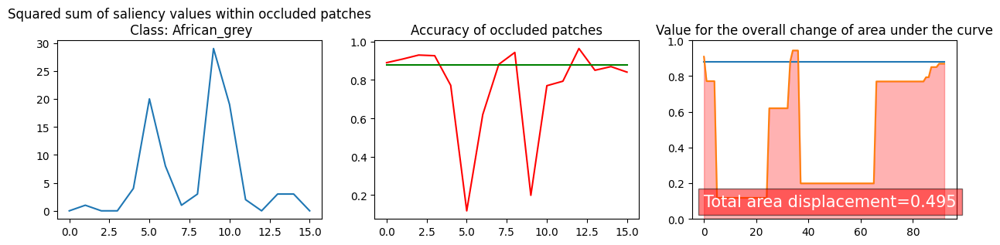

In [68]:
img_idx = 6
patch_size = 60
score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx = occlusion_run_accu_sensitivity(images[img_idx],
                                                                                                                                patch_size,
                                                                                                                                resnet_model_func,
                                                                                                                                np.sum)
print(list(zip(x_deltas, occluded_run_metric)))
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)

plot_occlusion_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx, classes)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_31864\3856500583.py:34: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


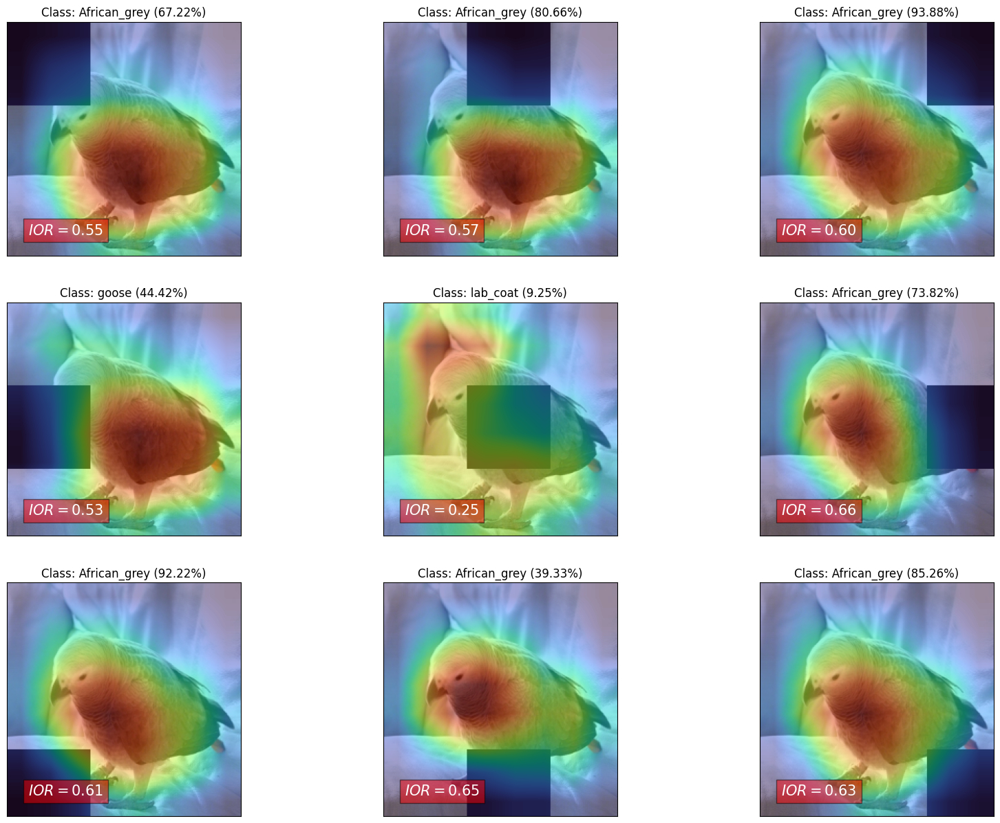

In [17]:
# Patch 80
img_idx = 6
patch_size = 80
sample_occlu_imgs = np.load(f"occluded_image_list_patch_{patch_size}_idx_{img_idx}.npy")
ior_values = np.array([])
fig, axes = plt.subplots(ncols=3, nrows=3)
fig.set_figheight(15)
fig.set_figwidth(20)

vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[img_idx]), vit_model)
for idx, axis in enumerate(axes.flat):
    try:
        img = sample_occlu_imgs[idx]
    except IndexError:
        break
    img = Image.fromarray((img*255).astype(np.uint8))
    
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    visualize_saliency_overlay(axis, img, resnet_mask, resnet_probs, resnet_idx, classes);
    
    resized_vit_mask = np.array(Image.fromarray(vit_cls_mask).resize((256, 256)))
    resized_obj_mask = np.array(Image.fromarray(obj_masks[img_idx]).resize((256, 256)))
    
    ior = insalient_outsalient_ratio_new(resnet_mask, resized_vit_mask, resized_obj_mask)
    ior_values = np.append(ior_values, ior)
    axis.text(2*10, axis.get_ylim()[0]-2*10, f"$IOR={ior:.2f}$", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
    axis.get_xaxis().set_visible(False)
    axis.get_yaxis().set_visible(False)
    
fig.show()

Text(0.5, 1.0, 'IOR sensitivity to occlusion patch size of 80')

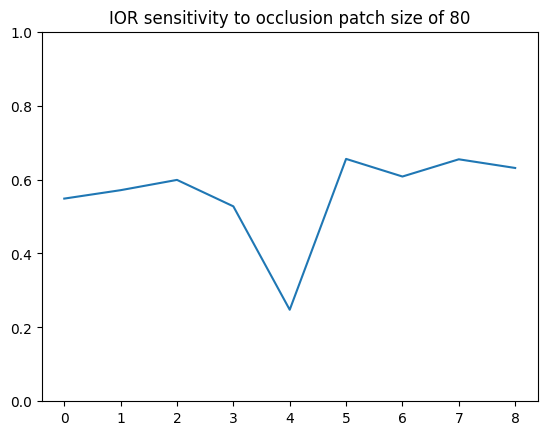

In [18]:
plt.plot(ior_values)
plt.ylim(0, 1)
plt.title(f"IOR sensitivity to occlusion patch size of {patch_size}")

#### Another metric to be created here:
is the sensitivity of the occlusion. Initially we give the un-occluded image to the model and save its saliency. After,  what we will do is to run the occlusion through the image and give the image to the model. At each step, we will check if the occlusion is occluding a region with high saliency value (in the original saliency map) and based on that we check how much did the score change. In the end, we accumulate all the values into a single value and call it **occlusion-run sensitivity**.

$$\text{Formula} = \sum_{i = 1}{d \over dx}f(x_i) * sal_i$$

In [22]:
sample_img = Image.fromarray(images[img_idx])
vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(sample_img, vit_model)

input_tensor = resnet_transform(sample_img).unsqueeze(0).to(device)
resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
resnet_mask =  resnet_mask.cpu().numpy().squeeze()
resnet_probs = resnet_probs.cpu().numpy()
resized_vit_mask = np.array(Image.fromarray(vit_cls_mask).resize((256, 256)))
resized_obj_mask = np.array(Image.fromarray(obj_masks[img_idx]).resize((256, 256)))

ior_original = insalient_outsalient_ratio_new(resnet_mask, resized_vit_mask, resized_obj_mask)
ior_original

0.5933205569153739

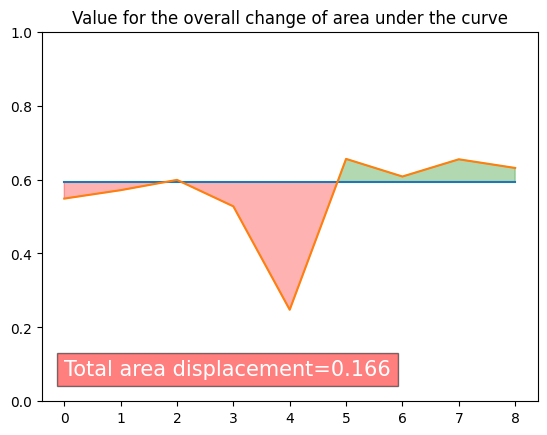

In [29]:
x = np.arange(0, ior_values.shape[0], 1)
y1 = np.repeat(ior_original, ior_values.shape[0])
y2 = ior_values

plt.fill_between(x, y2, y1, where=(y1 > y2), alpha=0.3, color='red', interpolate=True)
plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
plt.ylim(0, 1)
plt.plot(y1)
plt.plot(y2)

original_auc = ior_original * ior_values.shape[0]
occlusion_auc = sum([val*1 for val in ior_values])
# Okay the next step is to make sure the x_delta of the occlusion plot stretches out based on the median (mean?) saliency of the region
# that was being occluded at that moment in process.
x_delta = 1
area_integral = []
for idx in range(1, len(ior_values)):
    h = abs(ior_values[idx] - ior_values[idx-1])
    S = min(ior_values[idx], ior_values[idx-1])
    area = (S + (h/2)) * x_delta
    area_integral.append(area)

plt.text(0, 0+0.07, f"Total area displacement={(1-sum(area_integral)/original_auc):.3f}", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
plt.title("Value for the overall change of area under the curve");

Okay the next step is to make sure the x_delta of the occlusion plot stretches out based on the median (mean?) saliency of the region that was being occluded at that moment in process.
For IOR, its important to have a look at the agreement between saliencies as a metric of sensitivity, and not just one saliency (Should we use the insalient, outsalient, or the whole saliency for this?).

#### Occlusion-run sensitivity based on model score

In [23]:
def generate_img_occlusion_list(img, saliency, patch_size, saliency_reduce_func):
    
    saliency = np.array(Image.fromarray(saliency).resize((img.shape[0], img.shape[1])))
    occlusion_img_list = []
    occlusion_saliency_statistic = []
    
    for top_left_y in range(0, img.shape[1], patch_size):
        for top_left_x in range(0, img.shape[0], patch_size):
            patched_image = apply_patch(img, top_left_x, top_left_y, patch_size).astype('float32') / 255.0
            occlusion_img_list.append(patched_image)
            occlusion_saliency_statistic.append(saliency_reduce_func(saliency[top_left_y : top_left_y+patch_size,
                                                                              top_left_x : top_left_x+patch_size]))
            
    return np.array(occlusion_img_list), np.array(occlusion_saliency_statistic)

[(3, 0.6722139716148376), (4, 0.8065630197525024), (0, 0.9388349056243896), (18, 0.2518850564956665), (51, 0.00333013734780252), (5, 0.7382047772407532), (1, 0.9221713542938232), (13, 0.39330485463142395), (0, 0.8526178598403931)]


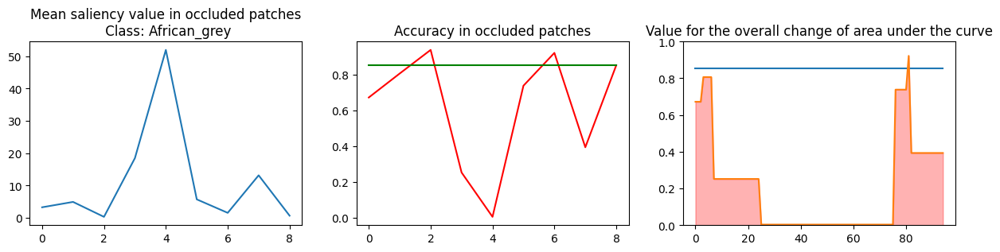

In [28]:
img_idx = 6
patch_size = 80

def resnet_model_func(img):
    img = Image.fromarray(img)
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    return resnet_mask, resnet_idx, resnet_probs

gen_occlu_images, saliency_statistic = generate_img_occlusion_list(images[img_idx], resnet_mask, patch_size, np.sum)
    
# Generate saliencies statistic using the original image

gen_occlu_images, saliency_statistic = generate_img_occlusion_list(images[img_idx], resnet_mask, patch_size, np.sum)
saliency_statistic = saliency_statistic**2
saliency_statistic = saliency_statistic / saliency_statistic.sum()
original_resnet_accuracy = resnet_probs[0, resnet_idx]
original_resnet_idx = resnet_idx

occluded_run_resnet_accuracies = np.array([])
for occu_img_idx in range(gen_occlu_images.shape[0]):
    img = Image.fromarray((gen_occlu_images[occu_img_idx]*255).astype(np.uint8))
    
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    resnet_accuracy = resnet_probs[0, original_resnet_idx]
    occluded_run_resnet_accuracies = np.append(occluded_run_resnet_accuracies, resnet_accuracy)
    
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)
axes[0].plot(saliency_statistic*100)
axes[0].set_title(f"Mean saliency value in occluded patches\n Class: {classes[original_resnet_idx]}")
axes[1].plot(occluded_run_resnet_accuracies, color="red")
axes[1].plot(np.repeat(original_resnet_accuracy,occluded_run_resnet_accuracies.shape[0]) , color="green")
axes[1].set_title("Accuracy in occluded patches")

def occlusion_run_accu_sensitivity(original_image, gen_occlu_images, saliency_statistic, model_func):
    model_original_mask, model_original_idx, model_original_probs = model_func(original_image)
    
    saliency_statistic = saliency_statistic**2
    saliency_statistic = saliency_statistic / saliency_statistic.sum()
    x_deltas = (saliency_statistic*100).astype(np.int32)
    
    occluded_run_metric = np.array([])
    for occu_img_idx in range(gen_occlu_images.shape[0]):
        model_mask, model_idx, model_probs = model_func(original_image)
        occluded_run_metric = np.append(occluded_run_metric, model_probs[model_original_idx])
    
    scaled_occluded_run_metric = np.repeat(occluded_run_metric, x_deltas)
    
    original_area = model_original_probs[model_original_idx] * np.sum(x_deltas)
    occu_area_integral = []
    for idx in range(1, len(scaled_occluded_run_metric)):
        x_delta = 1.0
        h = abs(scaled_occluded_run_metric[idx] - scaled_occluded_run_metric[idx-1])
        S = min(scaled_occluded_run_metric[idx], scaled_occluded_run_metric[idx-1])
        area = (S + (h/2)) * x_delta
        occu_area_integral.append(area)
    
    score = np.clip(1-(sum(occu_area_integral)/original_auc), 0, 1.0)
    return score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, model_original_probs, model_original_idx

x_deltas = (saliency_statistic*100).astype(np.int32)
print(list(zip(x_deltas, occluded_run_resnet_accuracies)))
scaled_occluded_run_resent_accuracies = np.repeat(occluded_run_resnet_accuracies, x_deltas)
x = np.arange(0, scaled_occluded_run_resent_accuracies.shape[0], 1)
y1 = np.repeat(original_resnet_accuracy, scaled_occluded_run_resent_accuracies.shape[0])
y2 = scaled_occluded_run_resent_accuracies

axes[2].fill_between(x, y2, where=(y2 > 0), alpha=0.3, color='red', interpolate=True)
# plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
axes[2].set_ylim(0, 1)
axes[2].plot(y1)
axes[2].plot(y2)

# original_auc = original_resnet_accuracy * np.sum(x_deltas)
# area_integral = []
# for idx in range(1, len(scaled_occluded_run_resent_accuracies)):
#     x_delta = 1
#     h = abs(scaled_occluded_run_resent_accuracies[idx] - scaled_occluded_run_resent_accuracies[idx-1])
#     S = min(scaled_occluded_run_resent_accuracies[idx], scaled_occluded_run_resent_accuracies[idx-1])
#     area = (S + (h/2)) * x_delta
#     area_integral.append(area)

# axes[2].text(0, 0+0.07, f"Total area displacement={1-(sum(area_integral)/original_auc):.3f}", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
axes[2].set_title("Value for the overall change of area under the curve");

In [39]:
def resnet_model_func(img):
    if img.dtype == np.float32 and img.max() <= 1 and img.min() >= 0:
        img = Image.fromarray((img*255).astype(np.uint8))
    else:
        img = Image.fromarray(img)
    input_tensor = resnet_transform(img).unsqueeze(0).to(device)
    resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
    resnet_mask =  resnet_mask.cpu().numpy().squeeze()
    resnet_probs = resnet_probs.cpu().numpy()
    
    return resnet_mask, resnet_idx, resnet_probs[0]

def occlusion_run_accu_sensitivity(original_image, model_original_mask, model_original_idx, model_original_probs, patch_size, model_func, saliency_reduce_func=np.sum):
    gen_occlu_images, saliency_statistic = generate_img_occlusion_list(original_image, model_original_mask, patch_size, saliency_reduce_func)
    
    saliency_statistic = saliency_statistic**2
    saliency_statistic = saliency_statistic / saliency_statistic.sum()
    x_deltas = (saliency_statistic*100).astype(np.int32)
    
    occluded_run_metric = np.array([])
    for occu_img in gen_occlu_images:
        _, _, model_probs = model_func(occu_img)
        occluded_run_metric = np.append(occluded_run_metric, model_probs[model_original_idx])
    
    scaled_occluded_run_metric = np.repeat(occluded_run_metric, x_deltas)
    
    original_area = model_original_probs[model_original_idx] * np.sum(x_deltas)
    occu_area_integral = []
    for idx in range(1, len(scaled_occluded_run_metric)):
        x_delta = 1.0
        h = abs(scaled_occluded_run_metric[idx] - scaled_occluded_run_metric[idx-1])
        S = min(scaled_occluded_run_metric[idx], scaled_occluded_run_metric[idx-1])
        area = (S + (h/2)) * x_delta
        occu_area_integral.append(area)
        
    score = np.clip(1-(sum(occu_area_integral)/original_area), 0, 1.0)
    return score, x_deltas, scaled_occluded_run_metric, occluded_run_metric

def plot_occlusion_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx, classes):
    x = np.arange(0, scaled_occluded_run_metric.shape[0], 1)
    y1 = np.repeat(original_probs[original_idx], scaled_occluded_run_metric.shape[0])
    y2 = scaled_occluded_run_metric

    axes[0].plot(x_deltas)
    axes[0].set_title(f"Squared sum of saliency values within occluded patches\n Class: {classes[original_idx]}")
    axes[1].plot(occluded_run_metric, color="red")
    axes[1].plot(np.repeat(original_probs[original_idx], occluded_run_metric.shape[0]) , color="green")
    axes[1].set_title("Accuracy of occluded patches")

    axes[2].fill_between(x, y2, where=(y2 > 0), alpha=0.3, color='red', interpolate=True)
    # plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
    axes[2].set_ylim(0, 1)
    axes[2].plot(y1)
    axes[2].plot(y2)

    axes[2].text(0, 0+0.07, f"Total area displacement={score:.3f}", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
    axes[2].set_title("Value for the overall change of area under the curve");
    
def plot_multipatch_occlusion_sensitivity(axes, img, original_mask, original_probs, original_idx, model_func, classes, patch_sizes):
    
    # img = Image.fromarray((img*255).astype(np.uint8))
    visualize_saliency_overlay(axes[0], Image.fromarray(img), original_mask, np.expand_dims(original_probs, 0), original_idx, classes);
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
    for idx, patch_size in enumerate(patch_sizes):
        score, x_deltas, scaled_occluded_run_metric, occluded_run_metric = occlusion_run_accu_sensitivity(img, original_mask, original_idx,
                                                                                                          original_probs, patch_size, model_func, np.sum)
        x = np.arange(0, scaled_occluded_run_metric.shape[0], 1)
        y1 = np.repeat(original_probs[original_idx], scaled_occluded_run_metric.shape[0])
        y2 = scaled_occluded_run_metric
        
        axes[1+idx].fill_between(x, y2, where=(y2 > 0), alpha=0.3, color='red', interpolate=True)
        # plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
        axes[1+idx].set_ylim(0, 1)
        axes[1+idx].plot(y1)
        axes[1+idx].plot(y2)
        axes[1+idx].text(0, 0+0.07, f"Total area displacement={score:.3f}", fontsize=8, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
        axes[1+idx].set_title(f"Area for patch size {patch_size}");

[(3, 0.6722139716148376), (4, 0.8065630197525024), (0, 0.9388349056243896), (18, 0.2518850564956665), (48, 0.00333013734780252), (7, 0.7382047772407532), (1, 0.9221713542938232), (14, 0.39330485463142395), (2, 0.8526178598403931)]


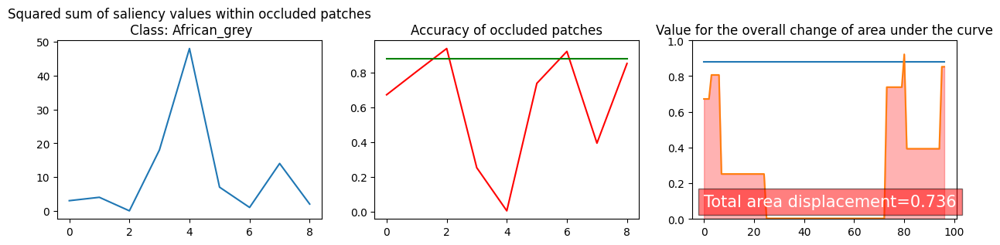

In [83]:
img_idx = 6
patch_size = 80

model_original_mask, model_original_idx, model_original_probs = resnet_model_func(images[img_idx])
score, x_deltas, scaled_occluded_run_metric, occluded_run_metric= occlusion_run_accu_sensitivity(images[img_idx],
                                                                                                 model_original_mask,
                                                                                                 model_original_idx,
                                                                                                 model_original_probs,
                                                                                                 patch_size,
                                                                                                 resnet_model_func,
                                                                                                 np.sum)
print(list(zip(x_deltas, occluded_run_metric)))
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)

plot_occlusion_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx, classes)

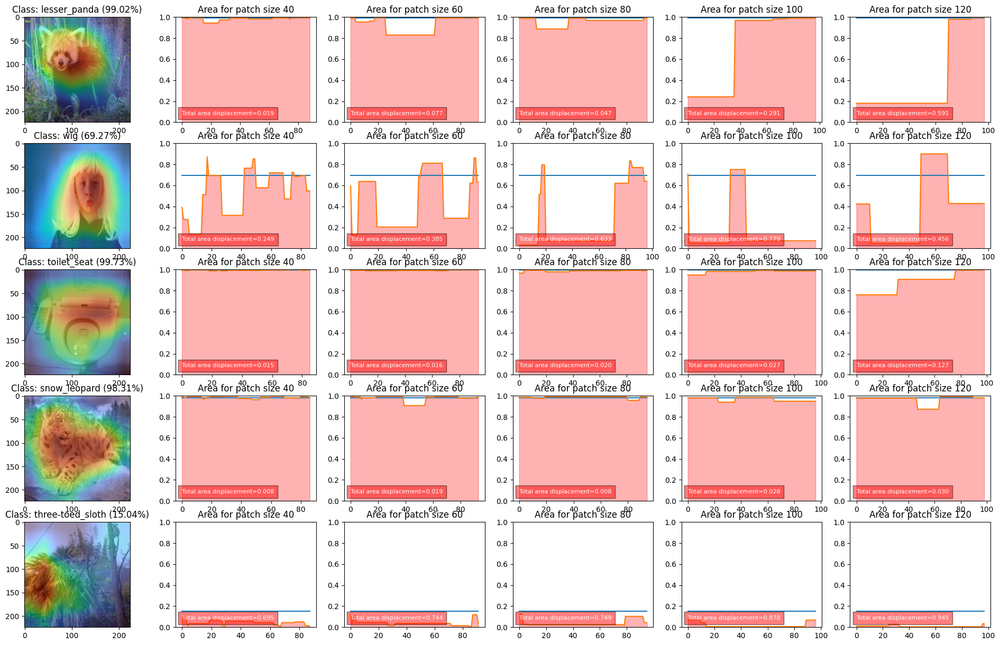

In [37]:
num_images = 5
patch_sizes = [40, 60, 80, 100, 120]

fig, axes = plt.subplots(ncols=1+len(patch_sizes), nrows=num_images)
fig.set_figheight(3*num_images)
fig.set_figwidth(4*(1+len(patch_sizes)))
    
for idx in range(num_images):
    original_mask, original_idx, original_probs = resnet_model_func(images[idx])
    plot_multipatch_occlusion_sensitivity(axes[idx], images[idx], original_mask, original_probs, original_idx, resnet_model_func, classes, patch_sizes)

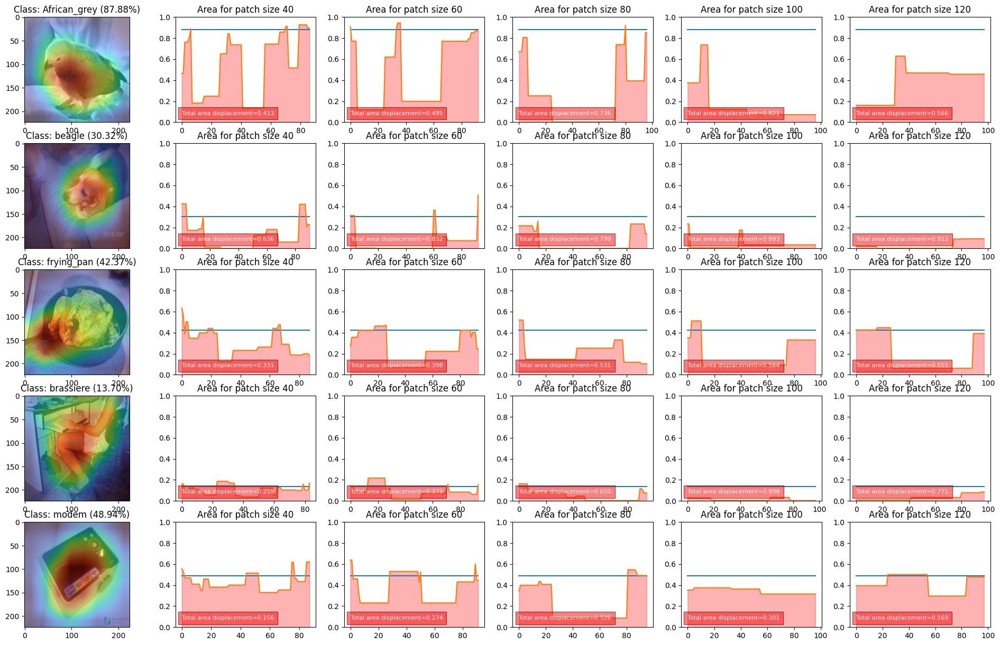

In [36]:
num_images = 5
offset = 6
patch_sizes = [40, 60, 80, 100, 120]

fig, axes = plt.subplots(ncols=1+len(patch_sizes), nrows=num_images)
fig.set_figheight(3*num_images)
fig.set_figwidth(4*(1+len(patch_sizes)))
    
for idx in range(num_images):
    original_mask, original_idx, original_probs = resnet_model_func(images[idx+offset])
    plot_multipatch_occlusion_sensitivity(axes[idx], images[idx+offset], original_mask, original_probs, original_idx, resnet_model_func, classes, patch_sizes)

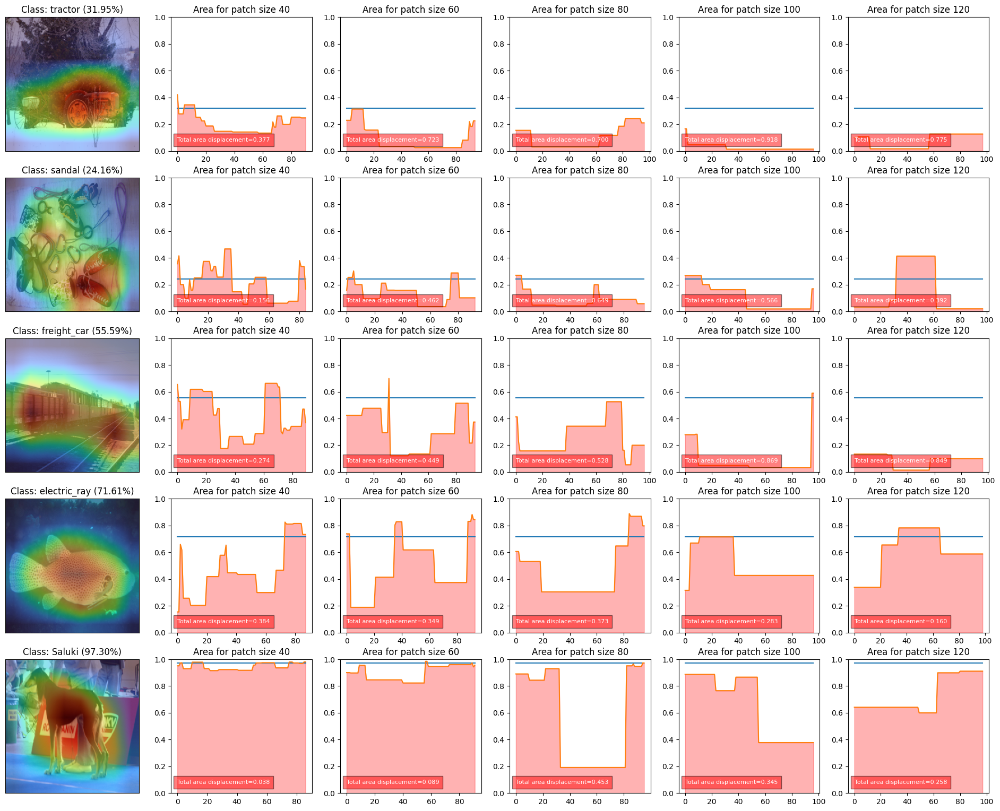

In [40]:
num_images = 5
offset = 11
patch_sizes = [40, 60, 80, 100, 120]

fig, axes = plt.subplots(ncols=1+len(patch_sizes), nrows=num_images)
fig.set_figheight(3.8*num_images)
fig.set_figwidth(4*(1+len(patch_sizes)))
    
for idx in range(num_images):
    original_mask, original_idx, original_probs = resnet_model_func(images[idx+offset])
    plot_multipatch_occlusion_sensitivity(axes[idx], images[idx+offset], original_mask, original_probs, original_idx, resnet_model_func, classes, patch_sizes)

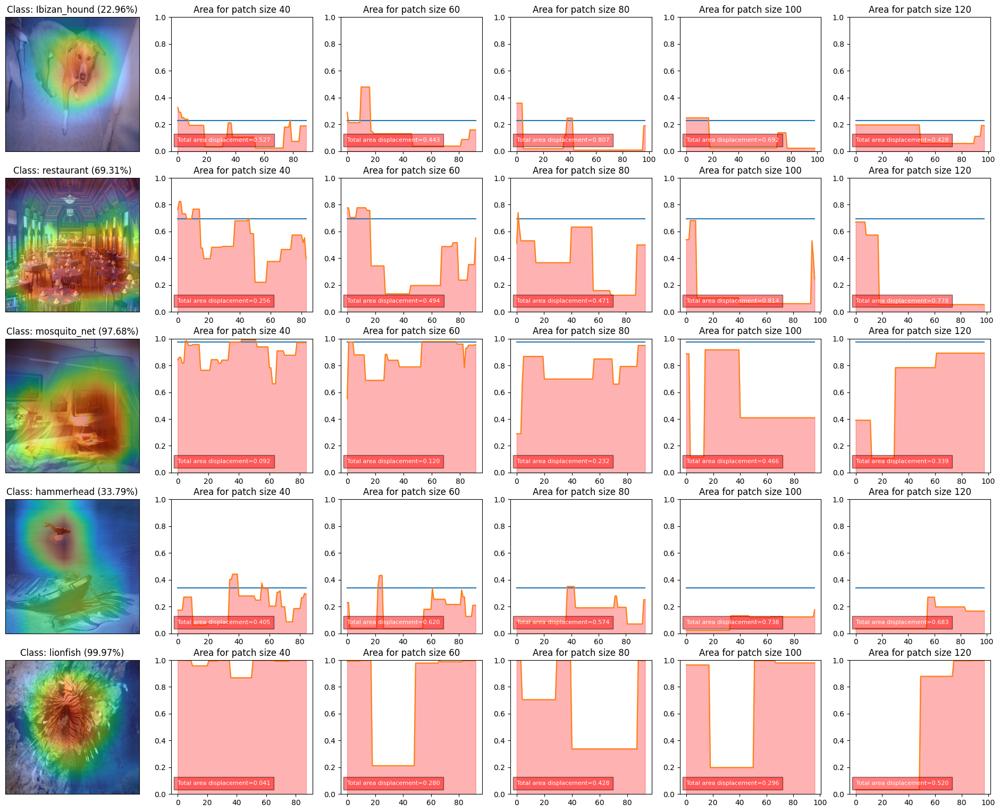

In [41]:
num_images = 5
offset = 16
patch_sizes = [40, 60, 80, 100, 120]

fig, axes = plt.subplots(ncols=1+len(patch_sizes), nrows=num_images)
fig.set_figheight(3.8*num_images)
fig.set_figwidth(4*(1+len(patch_sizes)))
    
for idx in range(num_images):
    original_mask, original_idx, original_probs = resnet_model_func(images[idx+offset])
    plot_multipatch_occlusion_sensitivity(axes[idx], images[idx+offset], original_mask, original_probs, original_idx, resnet_model_func, classes, patch_sizes)

In [42]:
def plot_occlusion_steps(img_idx, patch_size):
    sample_occlu_imgs = generate_img_occlusion_list_no_saliency(images[img_idx], patch_size)
    
    ior_values = np.array([])
    fig, axes = plt.subplots(ncols=3, nrows=3)
    fig.set_figheight(10)
    fig.set_figwidth(10)
    
    vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[img_idx]), vit_model)
    for idx, axis in enumerate(axes.flat):
        try:
            img = sample_occlu_imgs[idx]
        except IndexError:
            break
        img = Image.fromarray((img*255).astype(np.uint8))
        
        input_tensor = resnet_transform(img).unsqueeze(0).to(device)
        resnet_mask, resnet_idx, resnet_probs = scorecam_wrapped_model(input_tensor)
        resnet_mask =  resnet_mask.cpu().numpy().squeeze()
        resnet_probs = resnet_probs.cpu().numpy()
        
        visualize_saliency_overlay(axis, img, resnet_mask, resnet_probs, resnet_idx, classes);
        
        resized_vit_mask = np.array(Image.fromarray(vit_cls_mask).resize((256, 256)))
        resized_obj_mask = np.array(Image.fromarray(obj_masks[img_idx]).resize((256, 256)))
        
        ior = insalient_outsalient_ratio_new(resnet_mask, resized_vit_mask, resized_obj_mask)
        ior_values = np.append(ior_values, ior)
        axis.text(2*10, axis.get_ylim()[0]-2*10, f"$IOR={ior:.2f}$", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
        axis.get_xaxis().set_visible(False)
        axis.get_yaxis().set_visible(False)
        
    fig.show()

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_40708\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


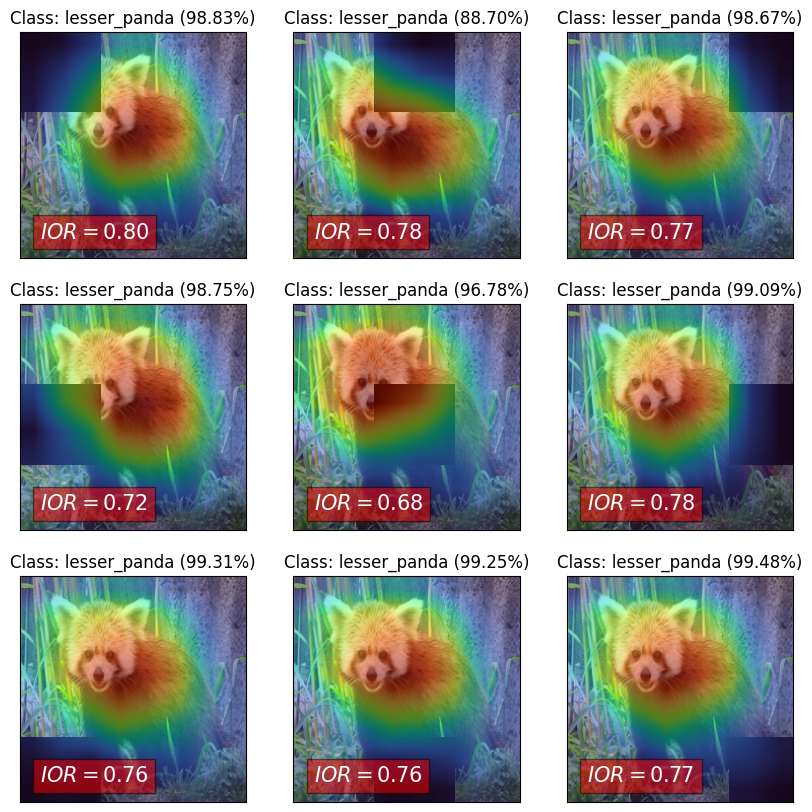

In [128]:
# Patch 80
img_idx = 0
patch_size = 80
plot_occlusion_steps(img_idx, patch_size)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_40708\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


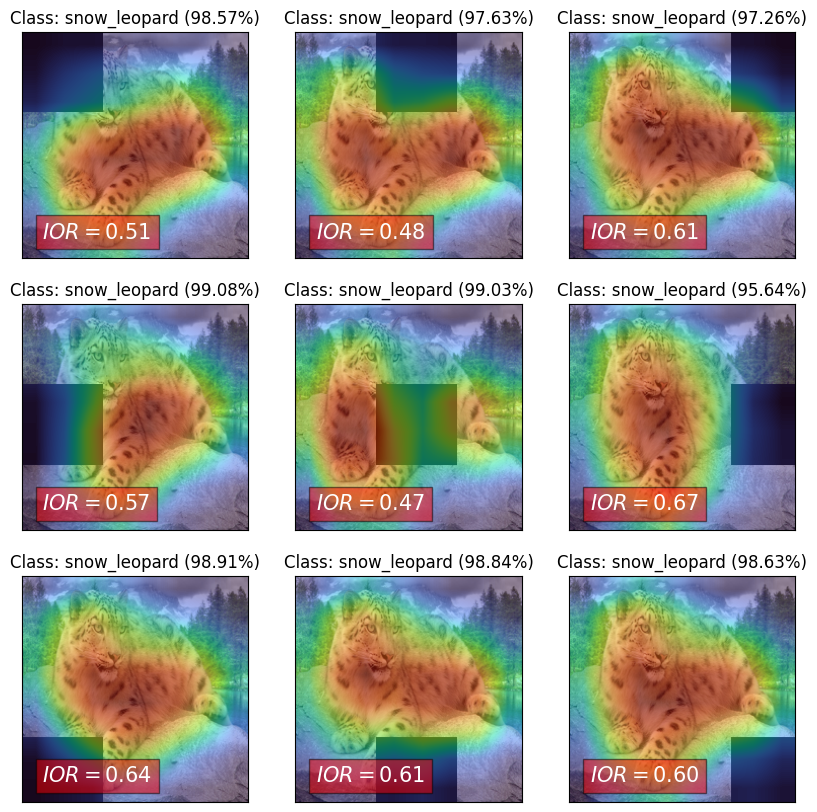

In [129]:
img_idx = 3
patch_size = 80
plot_occlusion_steps(img_idx, patch_size)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_41272\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


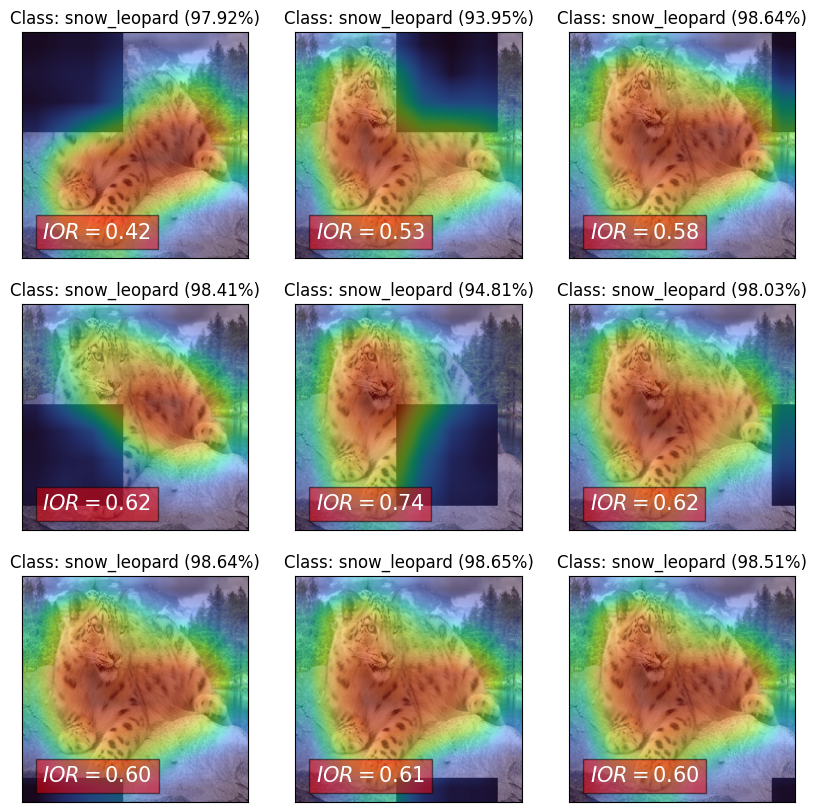

In [43]:
img_idx = 3
patch_size = 100
plot_occlusion_steps(img_idx, patch_size)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_41272\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


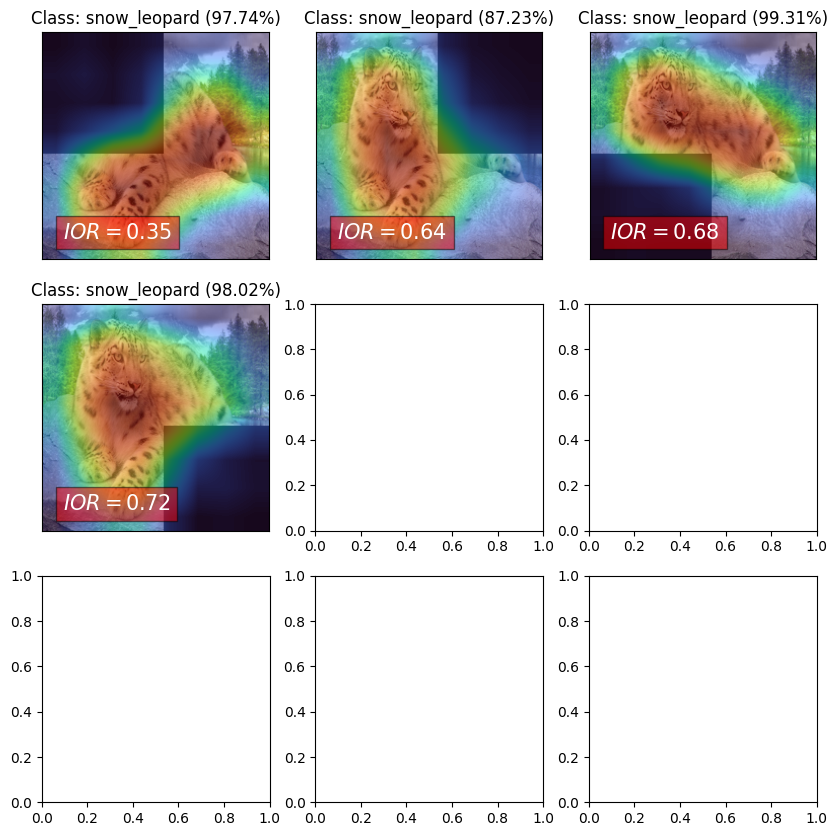

In [44]:
img_idx = 3
patch_size = 120
plot_occlusion_steps(img_idx, patch_size)

#### When the sensitivity is quite low

In [78]:
# ref_mask.shape
resized_ref_mask = np.array(Image.fromarray(ref_mask).resize((256, 256)))

[(11, 0.6722139716148376), (6, 0.8065630197525024), (2, 0.9388349056243896), (41, 0.2518850564956665), (0, 0.00333013734780252), (3, 0.7382047772407532), (11, 0.9221713542938232), (6, 0.39330485463142395), (15, 0.8526178598403931)]


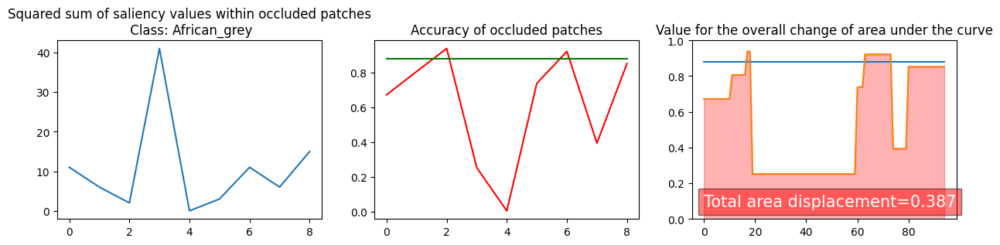

In [84]:
img_idx = 6
patch_size = 80

model_original_mask, model_original_idx, model_original_probs = resnet_model_func(images[img_idx])
model_original_mask =  model_original_mask * np.logical_not(resized_ref_mask)

score, x_deltas, scaled_occluded_run_metric, occluded_run_metric= occlusion_run_accu_sensitivity(images[img_idx],
                                                                                                 model_original_mask,
                                                                                                 model_original_idx,
                                                                                                 model_original_probs,
                                                                                                 patch_size,
                                                                                                 resnet_model_func,
                                                                                                 np.sum)
print(list(zip(x_deltas, occluded_run_metric)))
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)

plot_occlusion_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_probs, original_idx, classes)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_40708\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


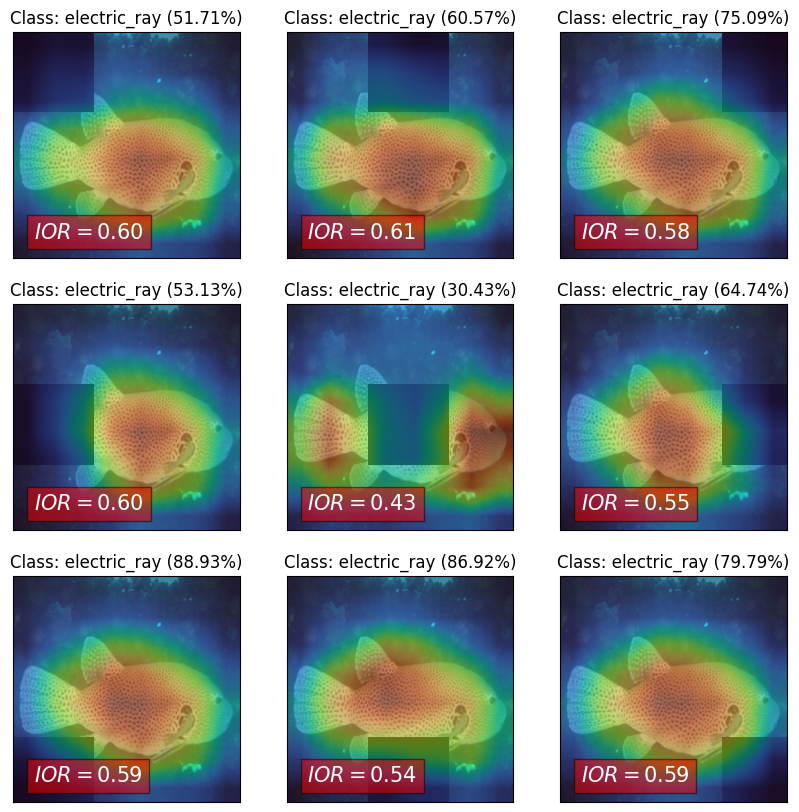

In [131]:
img_idx = 14
patch_size = 80
plot_occlusion_steps(img_idx, patch_size)

C:\Users\Khisrow\AppData\Local\Temp\ipykernel_40708\2985625312.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


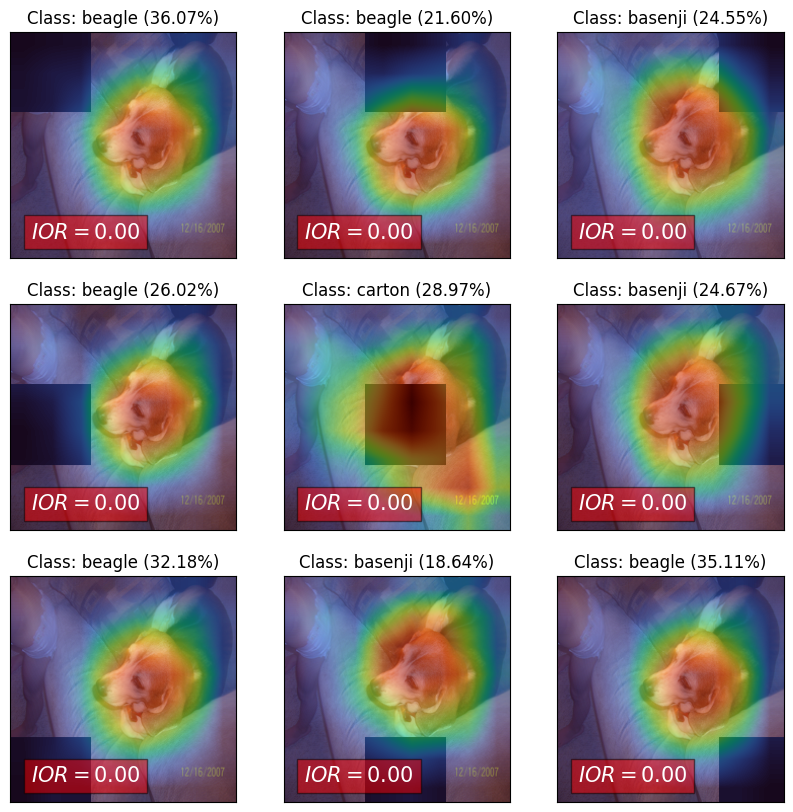

In [134]:
img_idx = 7
patch_size = 80
plot_occlusion_steps(img_idx, patch_size)

#### Occlusion Sensitivity with ViT

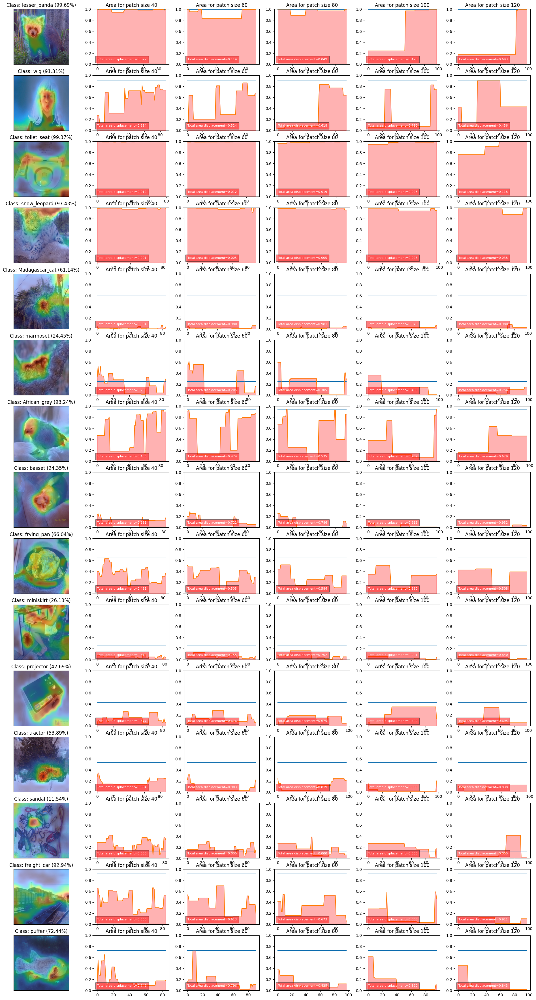

In [45]:
num_images = 15
offset = 0
patch_sizes = [40, 60, 80, 100, 120]

fig, axes = plt.subplots(ncols=1+len(patch_sizes), nrows=num_images)
fig.set_figheight(3*num_images)
fig.set_figwidth(4*(1+len(patch_sizes)))
    
for idx in range(num_images):
    
    original_probs, original_idx, (original_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[idx]), vit_model)
    # original_mask, original_idx, original_probs = resnet_model_func(images[idx+offset])
    plot_multipatch_occlusion_sensitivity(axes[idx], images[idx+offset], original_mask, original_probs.cpu().numpy()[0], original_idx, resnet_model_func, classes, patch_sizes)

In [116]:
original_probs, original_idx, (original_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[idx]), vit_model)

original_mask, original_idx, original_probs = resnet_model_func(images[idx+offset])

(256, 256)

#### NOTE:
it is important to consider that the patch size of the occlusion should be similar to size of the object inside the image, since that will make sure that for small objects we don't pick small patches (as those don't do much to occlude) and vice versa.
A better idea would be to take a weighted average of different patched occlusions. The weight will be higher for patches close to the area of the object in the image.

### Occlusion Sensitivity with IOR

In [60]:
def occlusion_run_ior_sensitivity(original_image, model_original_saliency, original_ior, patch_size, obj_mask, ior_func, ref_model_func, saliency_reduce_func=np.sum):
    
    gen_occlu_images, saliency_statistic = generate_img_occlusion_list(original_image, model_original_saliency, patch_size, saliency_reduce_func)
    saliency_statistic = saliency_statistic**2
    saliency_statistic = saliency_statistic / saliency_statistic.sum()
    x_deltas = (saliency_statistic*100).astype(np.int32)
    
    model_original_saliency = np.array(Image.fromarray(model_original_saliency).resize((original_image.shape[0], original_image.shape[1])))
    occluded_run_metric = np.array([])
    for occu_img in gen_occlu_images:
        ref_saliency, _, _ = ref_model_func(occu_img)
        ref_saliency = np.array(Image.fromarray(ref_saliency).resize((original_image.shape[0], original_image.shape[1])))
                                       
        ior = ior_func(ref_saliency, model_original_saliency, obj_mask)
        occluded_run_metric = np.append(occluded_run_metric, ior)
    
    scaled_occluded_run_metric = np.repeat(occluded_run_metric, x_deltas)
    
    original_area = original_ior * np.sum(x_deltas)
    occu_area_integral = []
    for idx in range(1, len(scaled_occluded_run_metric)):
        x_delta = 1.0
        h = abs(scaled_occluded_run_metric[idx] - scaled_occluded_run_metric[idx-1])
        S = min(scaled_occluded_run_metric[idx], scaled_occluded_run_metric[idx-1])
        area = (S + (h/2)) * x_delta
        occu_area_integral.append(area)
        
    score = np.clip(1-(sum(occu_area_integral)/original_area), 0, 1.0)
    return score, x_deltas, scaled_occluded_run_metric, occluded_run_metric

def plot_occlusion_ior_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_ior):
    x = np.arange(0, scaled_occluded_run_metric.shape[0], 1)
    y1 = np.repeat(original_ior, scaled_occluded_run_metric.shape[0])
    y2 = scaled_occluded_run_metric

    axes[0].plot(x_deltas)
    axes[0].set_title(f"Squared sum of saliency values within occluded patches")
    axes[1].plot(occluded_run_metric, color="red")
    axes[1].plot(np.repeat(original_ior, occluded_run_metric.shape[0]) , color="green")
    axes[1].set_title("IOR of occluded patches")

    axes[2].fill_between(x, y2, where=(y2 > 0), alpha=0.3, color='red', interpolate=True)
    # plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
    axes[2].set_ylim(0, 1)
    axes[2].plot(y1)
    axes[2].plot(y2)

    axes[2].text(0, 0+0.07, f"Total area displacement={score:.3f}", fontsize=15, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
    axes[2].set_title("Value for the overall change of area under the curve");
    
def plot_multipatch_occlusion_ior_sensitivity(axes, img, original_mask, original_ior, patch_sizes, obj_mask, ior_func, ref_model_func, saliency_reduce_func):
    
    # img = Image.fromarray((img*255).astype(np.uint8))
    visualize_saliency_overlay(axes[0], Image.fromarray(img), original_mask);
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
                                       
    for idx, patch_size in enumerate(patch_sizes):
                                       
        score, x_deltas, scaled_occluded_run_metric, occluded_run_metric = occlusion_run_ior_sensitivity(img, original_mask,original_ior,
                                                                                                         patch_size, obj_mask, ior_func,
                                                                                                         ref_model_func, saliency_reduce_func)
        x = np.arange(0, scaled_occluded_run_metric.shape[0], 1)
        y1 = np.repeat(original_ior, scaled_occluded_run_metric.shape[0])
        y2 = scaled_occluded_run_metric
        
        axes[1+idx].fill_between(x, y2, where=(y2 > 0), alpha=0.3, color='red', interpolate=True)
        # plt.fill_between(x, y2, y1, where=(y1 < y2), alpha=0.3, color='green', interpolate=True)
        axes[1+idx].set_ylim(0, 1)
        axes[1+idx].plot(y1)
        axes[1+idx].plot(y2)
        axes[1+idx].text(0, 0+0.07, f"Total area displacement={score:.3f}", fontsize=8, color="white", bbox={'facecolor' : "red", "alpha" : 0.5, "pad" : 5})
        axes[1+idx].set_title(f"Area for patch size {patch_size}");


0: 640x640 1 bird, 25.7ms
Speed: 3.0ms preprocess, 25.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


[(1, 0.2391813889699372), (0, 0.33849255527467065), (0, 0.26583178451663086), (0, 0.21535570242420854), (6, 0.2120522742053075), (5, 0.15396912661579404), (2, 0.22811149842160167), (3, 0.21112059680189899), (8, 0.20664215718600235), (13, 0.22270466995480262), (31, 0.20271885952683955), (14, 0.2026257591655587), (2, 0.21350750419202374), (1, 0.218052678287652), (4, 0.20622747841102718), (1, 0.20628084250748183)]


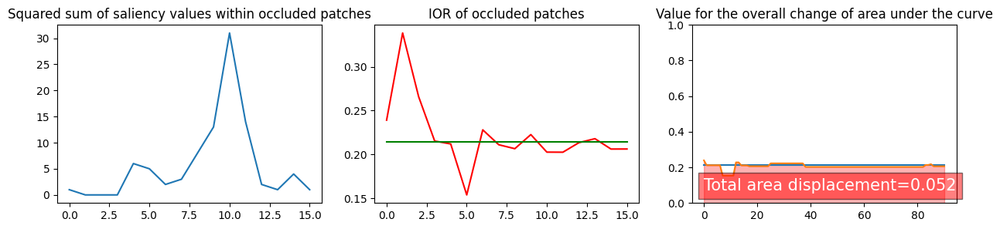

In [61]:
img_idx = 0
patch_size = 60

resnet_mask, resnet_idx, resnet_probs = resnet_model_func(images[img_idx])
resnet_mask = np.array(Image.fromarray(resnet_mask).resize((images[img_idx].shape[0], images[img_idx].shape[1])))

vit_probs, vit_idx, (vit_cls_mask, vit_distill_mask) = vit_saliency_map(Image.fromarray(images[idx]), vit_model)
vit_cls_mask = np.array(Image.fromarray(vit_cls_mask).resize((images[img_idx].shape[0], images[img_idx].shape[1])))

obj_mask = generate_yolo_segmentation_mask(yolo_model, images[idx])
obj_mask = np.array(Image.fromarray(obj_mask).resize((images[img_idx].shape[0], images[img_idx].shape[1])))

original_ior = insalient_outsalient_ratio_new(resnet_mask, vit_cls_mask, obj_mask)
score, x_deltas, scaled_occluded_run_metric, occluded_run_metric = occlusion_run_ior_sensitivity(images[img_idx], vit_cls_mask,
                                                                                                 original_ior, patch_size, obj_mask,
                                                                                                 insalient_outsalient_ratio_new,
                                                                                                 resnet_model_func, np.sum)
print(list(zip(x_deltas, occluded_run_metric)))
fig, axes = plt.subplots(ncols=3, nrows=1)
fig.set_figheight(3)
fig.set_figwidth(15)

plot_occlusion_ior_sensitivity(axes, score, x_deltas, scaled_occluded_run_metric, occluded_run_metric, original_ior)

In [ ]:
def noise_perturb_image(img_tensor, saliency_map, perturbation_strength=0.05, saliency_threshold=0.5, num_iterations=1, perturbation_prob=0.1):
    
    image = img_tensor.to(saliency_map.device)
    saliency_values = saliency_map.view(-1)
    threshold = torch.kthvalue(saliency_values, int((1 - saliency_threshold) * saliency_values.size(0)) + 1).values
    mask = torch.gt(saliency_map, threshold).float()
    
    # Perturb the image for a given number of iterations only at a random subset of the mask where the value is 1
    perturbed_image = image.clone()
    
    for i in range(num_iterations):
        perturbation_mask = (mask == 1) * (torch.rand_like(mask) < perturbation_prob).float()
        noise = torch.randn_like(perturbed_image) * perturbation_strength
        perturbation_mask = perturbation_mask.to(perturbed_image.device)  # Move perturbation_mask to the same device as perturbed_image
        noise = noise.to(perturbed_image.device)  # Move noise to the same device as perturbed_image
        perturbed_image = perturbed_image + perturbation_mask * noise
        perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

In [ ]:
from preprocess import img_to_tensor
import torch
import matplotlib.pyplot as plt

# from run_pipe import inference

def noise_perturb(img_path, out_dir, gt_saliency_map):
    img_tensor = img_to_tensor(img_path)
    saliency_threshold = 0.5
    perturbation_strength = 0.1
    perturbation_prob = 0.1
    for i in range(10):
        perturbed_tensor = noise_perturb_image(img_tensor, gt_saliency_map, perturbation_strength, saliency_threshold, 1, perturbation_prob)
        image_array = perturbed_tensor.squeeze().permute(1,2,0).detach().cpu().numpy()
        image_array = (image_array - np.min(image_array)) / (np.max(image_array) - np.min(image_array))    
        fig, ax = plt.subplots()
        ax.imshow(image_array, cmap = 'turbo', alpha = 0.8)
        plt.axis('off')
        fig.savefig(f"{out_dir}/{i}_noise.jpeg")

        perturbation_strength -= 0.01
        saliency_threshold += 0.005
        
#         inference(perturbed_tensor, model, out_dir, sal_method)

#         perturbed_tensor = perturbed_tensor.type_as(gpu_reference_tensor)
#         saliency_map_perturbed, perturbed_idx = wrapped_model(perturbed_tensor)
        
#         with torch.no_grad():
#             output = model(perturbed_tensor)
#             perturbed_class = torch.argmax(output).item()
#             prob = torch.softmax(output, dim=1)[0, perturbed_class].item()
#             img = reverse_normalize(perturbed_tensor)
#             heatmap = visualize(img, saliency_map_perturbed)
#             hm = (heatmap.squeeze().numpy().transpose(1, 2, 0))
            
#             ax.imshow(hm, cmap='turbo', alpha = 0.8)
#             ax.set_title(f"Class: {classes[perturbed_idx]}({prob*100:.2f}%)")
#             fig.savefig(f"{out_dir}/saliency/after_noise/{i}_{idx2label[idx].replace(' ','-')}.jpeg")
#             plt.show()